### Loading the super-tensor and creating the temporal networks

In this notebook we will explore the class __temporal_nets__ to compute preliminar results using network analysis.

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
# Adding GDa to path
import sys
sys.path.insert(1, '/home/vinicius/GrayData-Analysis')
# Importing the temporal network class
from   GDa.temporal_network              import temporal_network
from   GDa.misc.create_grids             import create_stages_time_grid
from   GDa.misc.reshape                  import reshape_trials, reshape_observations
from   GDa.net.util                      import compute_coherence_thresholds, \
                                                convert_to_adjacency
from   GDa.graphics.plot_raster          import plot_nodes_raster_all_bands 
from   GDa.graphics.plot_coherence_dists import plot_pooled_coherence_dists,\
                                                plot_pooled_coherence_dists_per_stage,\
                                                plot_pooled_coherence_dists_per_stim
from   GDa.graphics.plot_adjacency       import plot_adjacency 
from   GDa.net.layerwise                 import *
from   GDa.net.null_models               import *
from   GDa.net.temporal                  import *
import numpy                 as     np
import networkx              as     nx
import matplotlib.pyplot     as     plt
import igraph                as     ig
import leidenalg
import scipy.signal
import time
from   tqdm                  import tqdm
from   joblib                import Parallel, delayed
from   scipy                 import stats

# Just an auxiliary function to sommoth plots
def smooth(x, w):
    return scipy.signal.fftconvolve(x, np.ones(w)/w, mode='same')
# Just an auxiliary function to compute z-score
def zscore(x):
    z = np.zeros_like(x)
    for i in range(len(z)):
        if x.std() == 0:
            continue
        else:
            z[i] = (x[i]-x.mean())/x.std()
    return z
# Bands names
bands   = [r'band 1', r'band 2', r'band 3', r'band 4', r'band 5']
s_names = ['baseline', 'cue', 'delay', 'match'] 

To instantiate the __temporal_network__ we have to supply the monkey name, the session, and date to its constructor.

In [4]:
# Instantiating a temporal network object
net = temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', 
                       monkey='lucy', session=1, date='150128')

When instantiated, the temporal network object will load the recording info for the monkey, date, and sesion specified as well as the super tensor;

The super-tensor has dimensions [Number of pairs, Number of frequency bands, Number of trials, Time]. For Lucy the frequency bands analysed are:

- band $1$  = [0.1,6]  Hz;
- band $2$  = [6,14]   Hz;
- band $3$  = [14,26]  Hz;
- band $4$  = [26,42]  Hz;
- band $5$  = [42,80]  Hz;

It is possible to check which recording information was recordes by acessing the __session_info__ dictionary:

In [5]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 750, time: 244)>
array([[[[0.54071192, 0.55821458, 0.57140218, ..., 0.72647886,
          0.74082197, 0.74872413],
         [0.67813578, 0.62362767, 0.56588393, ..., 0.32711298,
          0.36618312, 0.40811544],
         [0.60549168, 0.53122872, 0.44849803, ..., 0.46580094,
          0.5000454 , 0.54244509],
         ...,
         [0.32450651, 0.33974166, 0.35591781, ..., 0.35234191,
          0.38681689, 0.42557978],
         [0.64720398, 0.65453722, 0.66511311, ..., 0.57880609,
          0.59393075, 0.61982153],
         [0.60473229, 0.57089283, 0.53015729, ..., 0.89980894,
          0.89800121, 0.89830877]],

        [[0.8073992 , 0.79328183, 0.77090179, ..., 0.50005879,
          0.53362803, 0.56502575],
         [0.65881416, 0.65771415, 0.65573059, ..., 0.50654171,
          0.52207258, 0.53903506],
         [0.49365731, 0.48991907, 0.48411938, ..., 0.86188484,
          0.85611576, 0.84669491],
         ...,
         [0.68544238, 0.61524104, 0.54202323, ..., 0.76653936,
          0.80009527, 0.82815331],
         [0.6335628 , 0.63554076, 0.63782269, ..., 0.54566988,
          0.53733555, 0.52779312],
         [0.57608682, 0.57644372, 0.57779726, ..., 0.75894786,
          0.75613209, 0.75270975]],

        [[0.81437572, 0.8111857 , 0.80636804, ..., 0.56178392,
          0.58977927, 0.61108995],
         [0.74534042, 0.73477727, 0.72185171, ..., 0.5360356 ,
          0.55140248, 0.57346679],
         [0.45233953, 0.46799648, 0.48390753, ..., 0.93106651,
          0.93603428, 0.9382808 ],
         ...,
         [0.55676777, 0.53352588, 0.51069088, ..., 0.79025963,
          0.81044878, 0.82658329],
         [0.15644084, 0.18481279, 0.20738379, ..., 0.45351503,
          0.44699717, 0.44499447],
         [0.39822951, 0.37690522, 0.35465085, ..., 0.4094263 ,
          0.43383338, 0.4626615 ]],

        [[0.57095477, 0.5300361 , 0.49221977, ..., 0.44864857,
          0.48184858, 0.51840863],
         [0.47636843, 0.45495817, 0.43619041, ..., 0.42651045,
          0.43509462, 0.44593968],
         [0.3962867 , 0.38031596, 0.3751037 , ..., 0.6076861 ,
          0.62250932, 0.63620932],
         ...,
         [0.61124098, 0.59953823, 0.58458648, ..., 0.65635067,
          0.68273364, 0.71003817],
         [0.45021172, 0.44882584, 0.45842263, ..., 0.51894087,
          0.56146526, 0.59913013],
         [0.56532081, 0.53724101, 0.51700975, ..., 0.47907417,
          0.49227295, 0.50490977]],

        [[0.4301623 , 0.41628367, 0.40525299, ..., 0.47963148,
          0.49856235, 0.51741096],
         [0.6270314 , 0.60345954, 0.58072941, ..., 0.42824662,
          0.44196782, 0.46000221],
         [0.44199621, 0.42511197, 0.40953035, ..., 0.43141789,
          0.44738149, 0.46616056],
         ...,
         [0.58720237, 0.55995297, 0.53343741, ..., 0.57718675,
          0.5804804 , 0.58298815],
         [0.55706406, 0.54309465, 0.53423277, ..., 0.50609552,
          0.52539361, 0.53950513],
         [0.48993932, 0.45958439, 0.42906321, ..., 0.46863334,
          0.48516023, 0.50340288]]],


       [[[0.64644486, 0.66131661, 0.67439485, ..., 0.95359768,
          0.95607279, 0.95802805],
         [0.40181432, 0.36545173, 0.33280147, ..., 0.32848708,
          0.32317922, 0.31697402],
         [0.78023537, 0.75910334, 0.73642542, ..., 0.77107124,
          0.78500137, 0.8030317 ],
         ...,
         [0.28902391, 0.32442063, 0.3584525 , ..., 0.32658489,
          0.34372317, 0.37490659],
         [0.73140902, 0.73671689, 0.74120367, ..., 0.54826348,
          0.54113889, 0.53784   ],
         [0.63620849, 0.63976812, 0.64662709, ..., 0.78470348,
          0.78823908, 0.78420369]],

        [[0.66814362, 0.62190849, 0.57626586, ..., 0.53084078,
          0.57953393, 0.6268217 ],
         [0.54599459, 0.54232057, 0.54027533, ..., 0.47989055,
          0.50686279, 0.53525822],
         [0.70283677, 0.68899584, 0.67455815, ..., 0.56875824,
          0.59048251, 0.61359217],
         ...,

In [6]:
print('Recording info available:\n')
print(list(net.super_tensor.attrs.keys()))

Recording info available:

['nT', 'areas', 'channels_labels', 'fsample', 'indch', 'nC', 'nP', 'pairs', 'stim', 't_cue_off', 't_cue_on', 't_match_on']


We can plot the super tensor to visualize the time series of link strength for each band (here we plot 10 trials for better visualization).

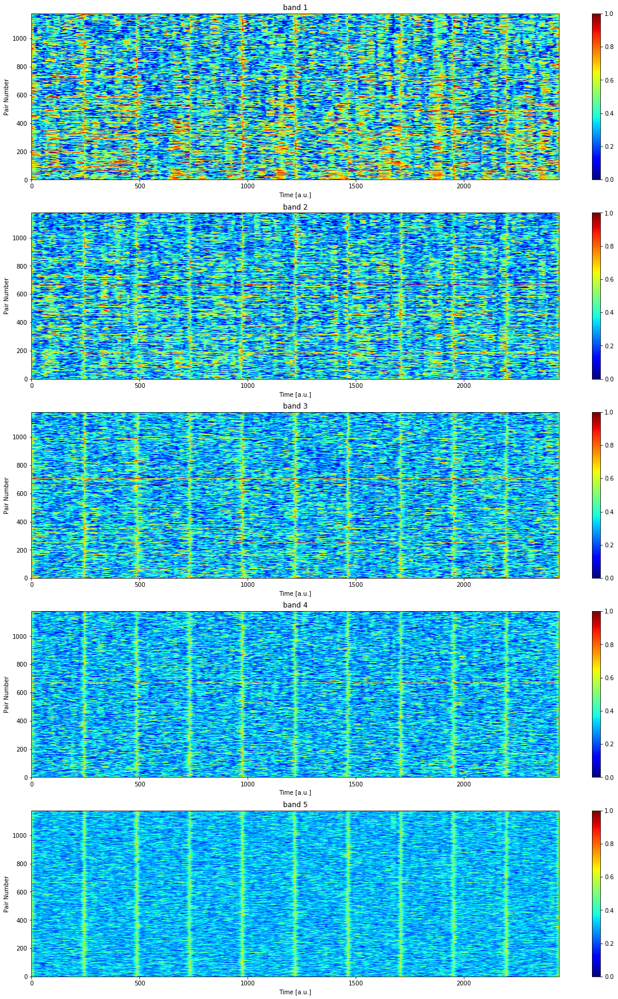

In [7]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'jet', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor_no_trim.png')

Notice that strong vertical stripes appear at the beggining/ending of each trial in the image above. This is due artifacts during wavelet estimation of pairwise coherences. To remove the border artifacts it is possible to instantiate the __temporal_network__ class specifing the parameter __trim_borders__ = True, and a value to the parameter __wt__. Doing that the firs and last __wt__ time points of the super tensor and the time array will be removed.

In [8]:
# Instantiating a temporal network object specifing trim_borders and wt.
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30))

Now let's plot the super tensor for the first ten trials again and observe that now the vertical stripes are gone.

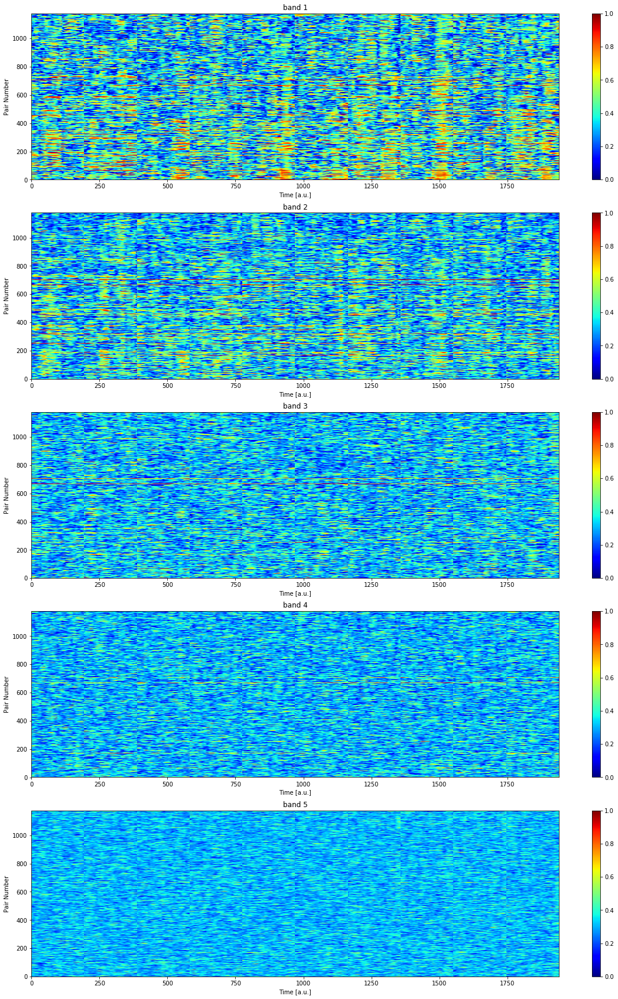

In [9]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'jet', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor.png')

### Thresholding

Some of the network theory measures can be applied to the binarized version of the network and in order to do so it is necessary to define thresholds for the coherence values, this can be done with the method __compute_thresholds__, this method receives a parameter __q__ between $0$ and $1$ that specifies that only links with coherence values in the top $(1-q)$ of the distribution will be kept.

The parameter __relative__ should be set as __False__ in case a common threshold (for each frequency band and trial) should be used for all the links or as __True__ if a threshold for each link (in each frequency band and trial) should be used instead.

In [ ]:
coh_thr = compute_coherence_thresholds(net.super_tensor.values,q=0.8,relative=True)

In [ ]:
coh_thr

In [ ]:
plt.figure(figsize=(10,6))
plt.subplot2grid((2,3), (0,0), rowspan=2, colspan=2)
plt.imshow(coh_thr[:,1,:], aspect='auto', cmap='jet', origin='lower'); plt.colorbar()
plt.ylabel('Link id', fontsize=15)
plt.xlabel('Trial number', fontsize=15)
plt.title('Coherence thresholds')
plt.subplot2grid((2,3), (0,2), rowspan=2, colspan=1)
mean_coh_thr = coh_thr[:,1,:].std(dim='trials')
plt.plot(mean_coh_thr, coh_thr.links.values)
plt.yticks([])
plt.tight_layout()

Since the __super_tensor__ and the __coh_thr__ variables are xarrays, the first can be easily thresholded.

In [59]:
st_b = net.super_tensor > coh_thr

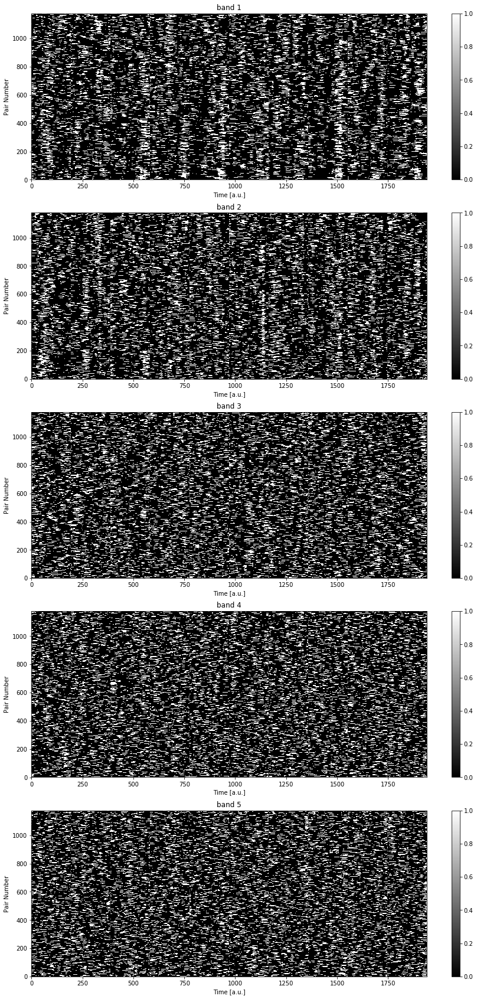

In [60]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(st_b[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])

Alternatvely, the __temporal_network__ class can also be instantiated by setting threshold as __True__ this will automatically threshold the super-tensor.

In [10]:
# Instantiating a temporal network object without thresholding the data
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                        relative=True, q=0.8)

  0%|          | 0/750 [00:00<?, ?it/s]

Computing coherence thresholds


100%|██████████| 750/750 [06:45<00:00,  1.85it/s]


In [11]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 750, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True, False],
         [ True,  True, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, 

In [12]:
print('Recording info available:\n')
print(list(net.super_tensor.attrs.keys()))

Recording info available:

['nT', 'areas', 'channels_labels', 'fsample', 'indch', 'nC', 'nP', 'pairs', 'stim', 't_cue_off', 't_cue_on', 't_match_on']


Let's plot the binarized super tensor:

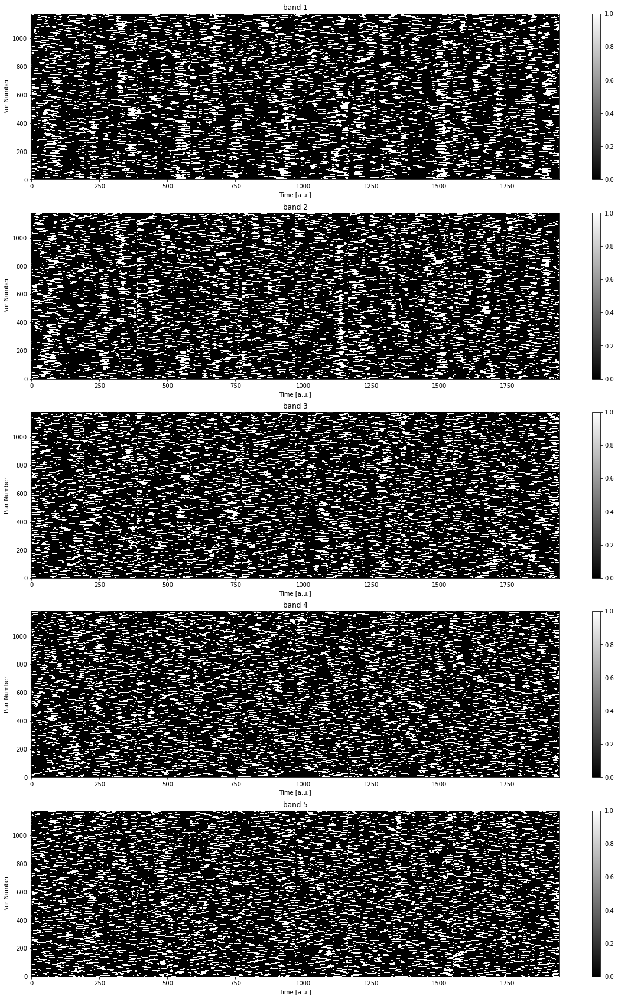

In [13]:
plt.figure(figsize=(20,30))
for i in range(len(bands)):
    plt.subplot(len(bands), 1, i+1)
    plt.imshow(net.super_tensor[:,i,:10,:].values.reshape(net.super_tensor.shape[0],10*len(net.tarray)), 
               aspect = 'auto', cmap = 'gray', origin = 'lower', 
               extent = [0, 10*len(net.tarray), 1, net.session_info['nP']], vmin = 0, vmax = 1)
    plt.colorbar()
    plt.ylabel('Pair Number')
    plt.xlabel('Time [a.u.]')
    plt.title(bands[i])
plt.savefig('../figures/layerwise_net/super_tensor_thresholded.png')

To use the Python package networkx or igraph to compute network theory quantities it is necessary to instantiate a __Graph__ object, to do so we have to provide an adjacency matrix to the __Graph__ method. Note that the super tensor is the edge representation of the network, but we can convert it to an adjacency matrix by calling the methdo __convert_to_adjacency__ in the class __temporal_network__. This method will create the variable __A__ inside the object.

In [14]:
net.convert_to_adjacency()

The adjacency matrix has dimensions [Number of channels, Number of channels Number of frequency bands, Number of trials * Time]. Let's plot both the weighted and binary adjancency matrix for the 10th observation (or time stamp) of the alpha band.

In [15]:
net.A

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 750, time: 194)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 0., 0., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 1., 1., 0.],
          [1., 1., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1.,

In [16]:
print( net.A.shape )

(49, 49, 5, 750, 194)


Text(0.5, 1.0, 'Binarized, band1 observation 160')

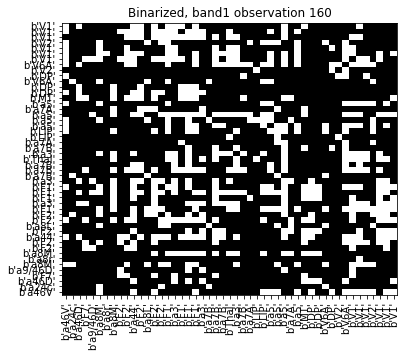

In [17]:
# Random time stamp
t_rnd = np.random.randint(0, net.super_tensor.shape[-1])
plt.figure(figsize=(6,5))
plt.imshow(net.A[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin = 'lower')
plt.xticks(range(net.A.shape[0]),net.session_info['areas'], rotation=90)
plt.yticks(range(net.A.shape[0]),net.session_info['areas'])
plt.title(r'Binarized, band1 observation ' + str(t_rnd))

Before moving to the measures and preliminary results, during the analysis we may be interested to separate the measures we make by task stage, to do so we need some way to acess our arrays (super_tensor, adjacency matrix, node_degree...) in an specific stage. Using the method __create_stages_time_grid__ (from __GDa.misc.create_grids__), four arrays will be returned: __t_baseline__, __t_cue__, __t_delay__, and __t_match__. Using those array any stage can be acessed easily, let's suposse you want the super tensor values only for the delay period in alpha band, you can retrieve this values by doing:

```net.super_tensor[:,1,s_mask['delay']] ```

In [18]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'], net.super_tensor.attrs['t_cue_off'],
                                 net.super_tensor.attrs['t_match_on'], net.super_tensor.attrs['fsample'],
                                 net.tarray, net.super_tensor.attrs['nT'])

Now let's plot for each trial the duration of each period

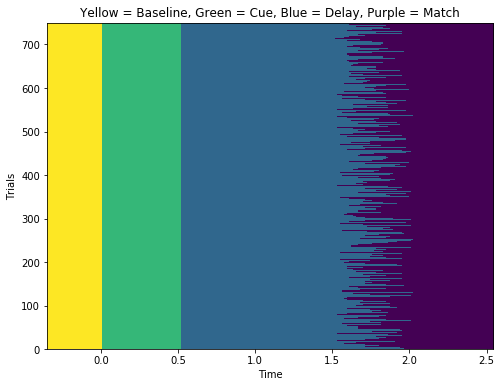

In [19]:
stages = np.zeros([net.super_tensor.attrs['nT'],len(net.tarray)])

ii     = [s_mask['baseline'], 
          s_mask['cue'], 
          s_mask['delay'],
          s_mask['match']]

for i in range(4):
    stages = stages - i * ii[i]
    
plt.figure(figsize = (8,6))
plt.imshow(stages, aspect='auto',cmap='viridis',origin='lower', extent=[net.tarray[0],net.tarray[-1],1,net.session_info['nT']])
plt.ylabel('Trials')
plt.xlabel('Time')
plt.title('Yellow = Baseline, Green = Cue, Blue = Delay, Purple = Match')
plt.savefig('../figures/layerwise_net/stages.png')

In [ ]:
# Values of q used
q_list     = np.linspace(0.2, 0.9, 10)
n_retained = np.zeros([len(q_list), len(net.bands), 4]) # [Values of q, Number of bands, Number of stages]
# Computing the threshold for the specific q value
for i in tqdm( range( len( q_list) ) ):
    # Instantiating a temporal network threshold with the respective q value
    net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                            session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                            relative=True, q=q_list[i])
    for j in range( len(net.bands) ):
        # Binary super tensor
        bst               = net.super_tensor[:,j,:]
        n_retained[i,j,0] = bst[:,s_mask['baseline']].sum() / (net.session_info['nP'] * np.sum(s_mask['baseline']))
        n_retained[i,j,1] = bst[:,s_mask['cue']].sum()      / (net.session_info['nP'] * np.sum(s_mask['cue']))
        n_retained[i,j,2] = bst[:,s_mask['delay']].sum()    / (net.session_info['nP'] * np.sum(s_mask['delay']))
        n_retained[i,j,3] = bst[:,s_mask['match']].sum()    / (net.session_info['nP'] * np.sum(s_mask['match']))

In [ ]:
plt.figure(figsize=(6,20))
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    plt.semilogy(q_list, n_retained[:,j,0], label = 'Baseline')
    plt.semilogy(q_list, n_retained[:,j,1], label = 'Cue')
    plt.semilogy(q_list, n_retained[:,j,2], label = 'Delay')
    plt.semilogy(q_list, n_retained[:,j,3], label = 'Match')
    plt.title(bands[j] + ' band')
    plt.legend()
    plt.xlabel('q')
    plt.ylabel('Fraction of retained links')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/fraction_reained_links.png')

In [26]:
# Setting threshold back to q=0.8
net =  temporal_network(data_raw_path = '../GrayLab/', tensor_raw_path = '../super_tensors/', monkey='lucy', 
                        session=1, date='150128', trim_borders=True, wt=(20,30), threshold=True, 
                        relative=True, q=0.8)

In [27]:
net.convert_to_adjacency()

### Null models and temporal correlations

#### Creating null models for each band and randomized edges and time frames.

In [18]:
# Shuffling frames
A_s = np.empty_like(net.A)
# Randomizing edges
A_r = np.empty_like(net.A)

In [22]:
for t in tqdm( range(net.super_tensor.attrs['nT']) ):
    for i in range(len(net.bands)):
        A_s[:,:,i,t,:] = shuffle_frames(net.A[:,:,i,t,:].values)

100%|██████████| 750/750 [00:24<00:00, 30.34it/s]


In [23]:
for t in tqdm( range(net.super_tensor.attrs['nT']) ):
    for i in range(len(net.bands)):
        A_r[:,:,i,t,:] = randomize_edges(net.A[:,:,i,t,:].values, n_rewires=1000)

100%|██████████| 750/750 [10:50<00:00,  1.15it/s]


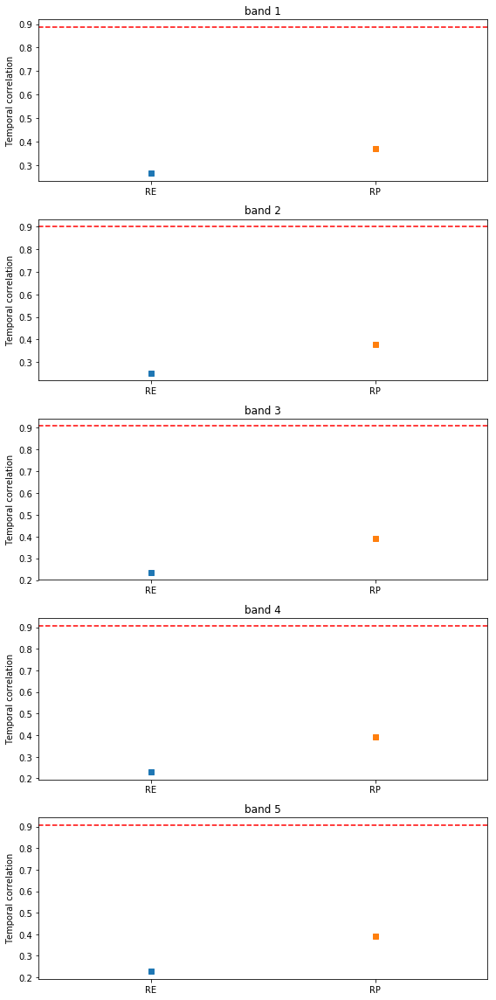

In [35]:
plt.figure(figsize=(8,16))
for i in range(len(net.bands)):
    # Original network
    CC_on = compute_temporal_correlation(
        #net.A[:,:,i,:,:].values.reshape(net.A.shape[0],net.A.shape[1],net.A.shape[3]*net.A.shape[4])
        net.A[:,:,i,:,:].stack(observations=("trials", "time")).values
    )
    # Randomize on edges
    CC_re = compute_temporal_correlation(
        A_r[:,:,i,:,:].reshape(A_r.shape[0],A_r.shape[1],A_r.shape[3]*A_r.shape[4])
    )
    # Randomize on time
    CC_rt = compute_temporal_correlation(
        A_s[:,:,i,:,:].reshape(A_s.shape[0],A_s.shape[1],A_s.shape[3]*A_s.shape[4])
    )
    # Plotting
    plt.subplot(5,1,i+1)
    plt.plot(1, CC_re, marker='s')
    plt.plot(3, CC_rt, marker='s')
    plt.hlines(CC_on, 0, 4, linestyle='--', color = 'r')
    plt.xlim([0,4])
    plt.ylabel('Temporal correlation')
    plt.xticks([1,3], ['RE', 'RP'])
    plt.title(bands[i])
plt.tight_layout()

### Jaccard index

In [20]:
J = {}
for i in tqdm( range(len(net.bands)) ): 
    #A_aux = reshape_trials(net.A[:,:,i,:], net.super_tensor.attrs['nT'], len(net.tarray))
    #J[str(i)] = jaccard_index(A_aux, mirror=True)
    J[str(i)] = jaccard_index(net.A[:,:,i,:,:].values, mirror=False)

  0%|          | 0/5 [00:00<?, ?it/s]/home/vinicius/GrayData-Analysis/GDa/net/temporal.py:54: RuntimeWarning: invalid value encountered in true_divide
  J = num/den
100%|██████████| 5/5 [00:29<00:00,  5.92s/it]


100%|██████████| 5/5 [00:00<00:00,  7.46it/s]


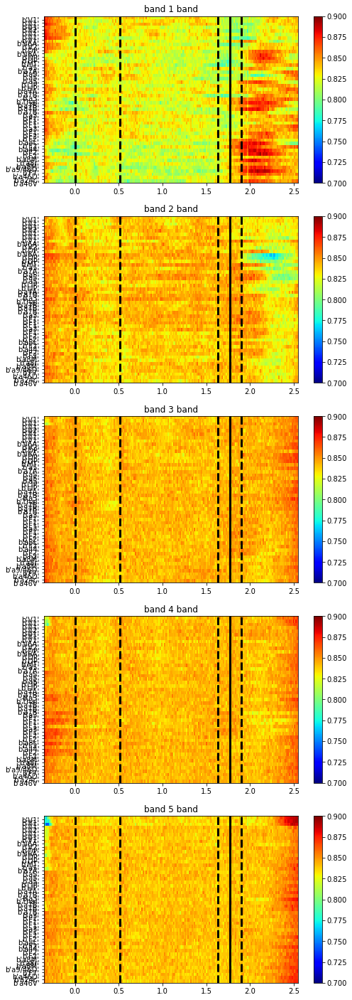

In [21]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    plt.imshow(np.nansum(J[str(i)], axis=1)/J[str(i)].shape[1], aspect = 'auto', 
                         cmap = 'jet', origin = 'lower',
                         extent = [net.tarray[0],net.tarray[-1],0,49], vmin=.7, vmax=0.9);plt.colorbar()
    plt.vlines(0, 0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       0, 49, linestyle='-', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       0, 49, linestyle='--', linewidth = 3, color = 'k')
    plt.yticks(range(49), net.session_info['areas'])
    plt.title(bands[i] + ' band')

100%|██████████| 5/5 [00:08<00:00,  1.69s/it]


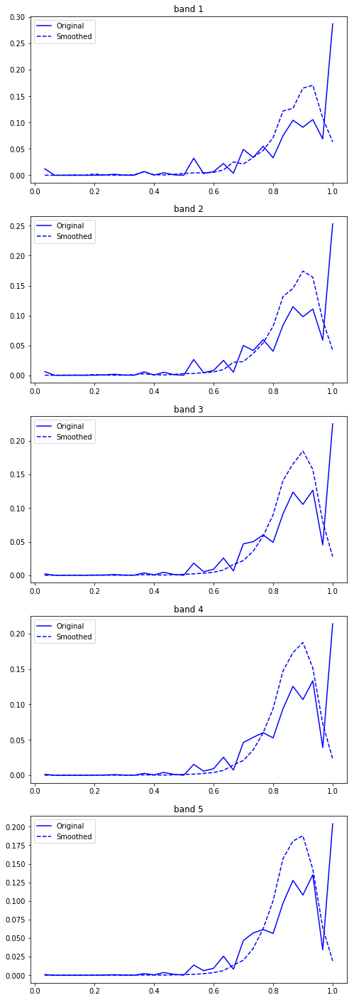

In [22]:
plt.figure(figsize=(8,25))
for i in tqdm( range(len(net.bands)) ):  
    plt.subplot(5,1,i+1)
    aux = J[str(i)][~np.isnan(J[str(i)])].flatten(order='C')
    c, x = np.histogram(aux, 30)
    plt.plot(x[1:], c/np.sum(c), 'b')
    plt.title(bands[i] + ' bands')
    c, x = np.histogram(smooth(aux, 3), 30)
    plt.plot(x[1:], c/np.sum(c), 'b--')
    plt.title(bands[i])
    plt.legend(['Original', 'Smoothed'])

### Filtering trials

If one wants to analyse specific trials, for instance trials were the ODRT was performed, the __trials_info__ dictionary can be used to do so. To illustrate, let's work only with trials of type 1, were the monkey was successful.

In [20]:
net.trial_info.head()

,trial_index,behavioral_response,match_image,match_location,match_on,nonmatch_image,nonmatch_location,num_trials,reaction_time,sample_image,sample_location,sample_off,sample_on,trial_type
0,0,NaN,NaN,NaN,2654.0,NaN,NaN,1006.0,NaN,NaN,NaN,1495.0,975.0,2.0
1,1,1.0,2.0,7.0,2824.0,4.0,3.0,1006.0,145.0,2.0,1.0,1371.0,851.0,1.0
2,2,1.0,5.0,8.0,2946.0,4.0,4.0,1006.0,205.0,5.0,1.0,1600.0,1093.0,1.0
3,3,1.0,2.0,3.0,2954.0,3.0,7.0,1006.0,260.0,2.0,1.0,1528.0,1021.0,1.0
4,9,1.0,4.0,7.0,2759.0,2.0,3.0,1006.0,178.0,4.0,1.0,1480.0,973.0,1.0


In [21]:
# Getting the number for those trials
filtered_trials     = net.trial_info[(net.trial_info['trial_type']==1.0)\
                                   & (net.trial_info['behavioral_response']==1.0)].trial_index.values
# Getting the index for those trials
filtered_trials_idx = net.trial_info[(net.trial_info['trial_type']==1.0)\
                                   & (net.trial_info['behavioral_response']==1.0)].index.values

In [22]:
print(filtered_trials[::10])
print(filtered_trials_idx[::10])

[  1  20  43  61  78 106 124 145 159 171 181 198 211 225 243 256 266 281
 299 317 330 346 368 383 398 415 432 450 468 479 495 513 533 544 559 574
 587 607 622 644 660 675 690 702 718 735 750 775 792 808 822 839 855 868]
[  1  11  25  37  50  65  80  92 103 114 124 135 147 157 168 178 188 200
 214 227 237 248 262 274 287 300 312 324 336 347 358 370 384 395 405 415
 426 438 450 461 474 485 495 506 517 528 539 554 565 576 587 599 610 620]


In [24]:
net.super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 750, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True, False],
         [ True,  True, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]]],


       [[[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, 

In [25]:
# Filter supertensor for the desired trials
filtered_super_tensor = net.super_tensor.sel(trials = filtered_trials)

In [26]:
filtered_super_tensor

<xarray.DataArray (links: 1176, bands: 5, trials: 540, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]],


       [[[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True, False, ...,  True,  True,  True]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False]]],


       [[[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, 

In [27]:
filtered_adjacency = net.A.sel(trials = filtered_trials)

In [28]:
filtered_adjacency

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 540, time: 194)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 0., ..., 1., 1., 1.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [0., 0.,

In [82]:
# Randomized adjacency matrix for the filtered data
A_r = np.empty_like(filtered_adjacency)
for t in tqdm( range(len(filtered_trials)) ):
    for i in range(len(net.bands)):
        A_r[:,:,i,t,:] = randomize_edges(filtered_adjacency[:,:,i,t,:].values, n_rewires=1000)

100%|██████████| 540/540 [07:25<00:00,  1.21it/s]


### Average coherence

Text(0, 0.5, 'Average coherence')

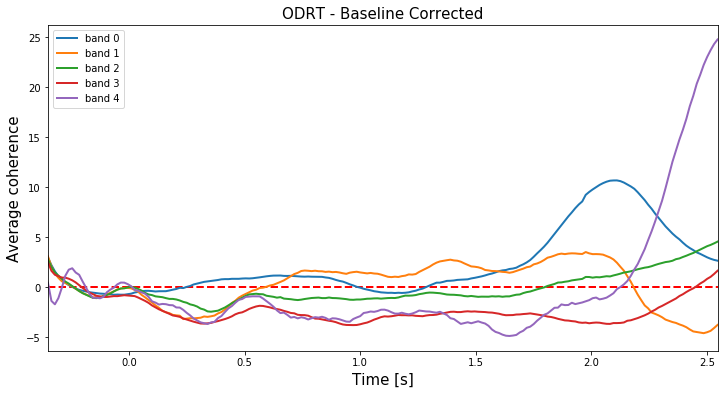

In [83]:
plt.figure(figsize=(12,6))
# Averaged supertensor
avg_coh = filtered_super_tensor.mean(dim='links').mean(dim='trials')
# Baseline indexes
b_idx   = net.tarray<0
for i in range(len(net.bands)):
    Z = (avg_coh[i]-avg_coh[i,b_idx].mean())/avg_coh[i,b_idx].std()
    plt.plot(net.tarray, Z, lw=2, label='band ' + str(i) )
plt.hlines(0,net.tarray[0],net.tarray[-1], linestyles='--', color='r', lw=2)
plt.xlim([net.tarray[0],net.tarray[-1]])
plt.legend()
plt.title('ODRT - Baseline Corrected', fontsize=15)
plt.xlabel('Time [s]', fontsize=15)
plt.ylabel('Average coherence', fontsize=15)

In [84]:
avg_coh = filtered_super_tensor.mean(dim='links')

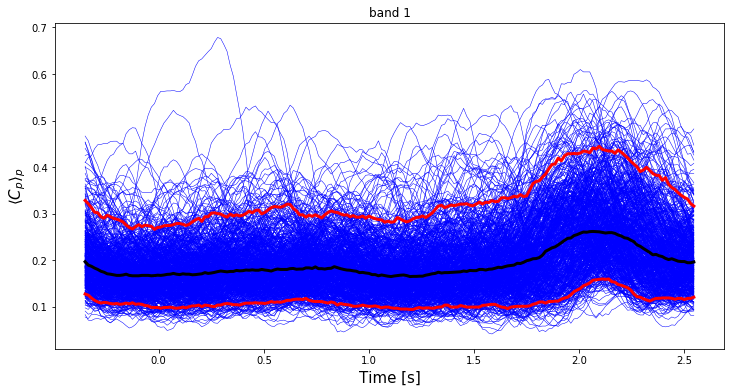

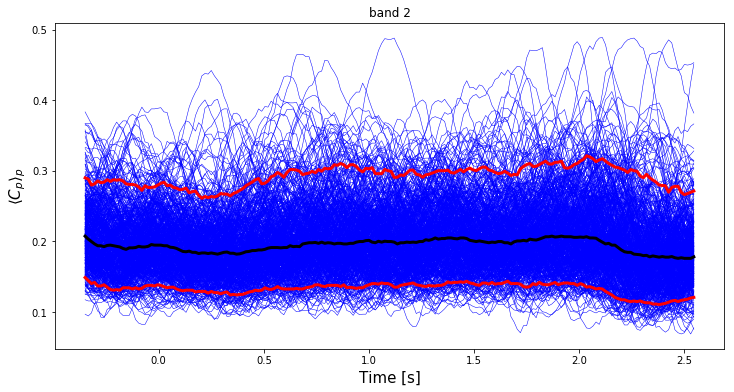

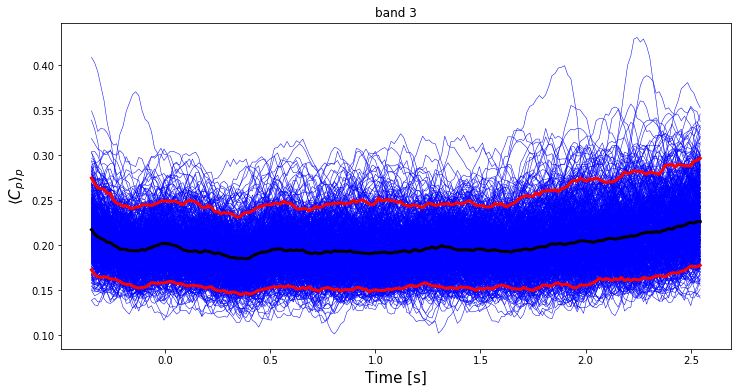

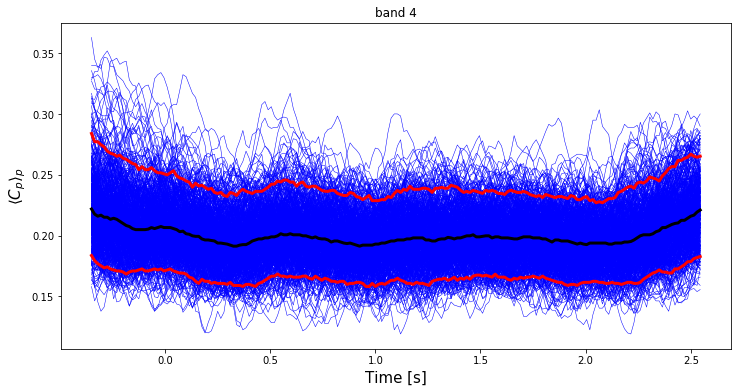

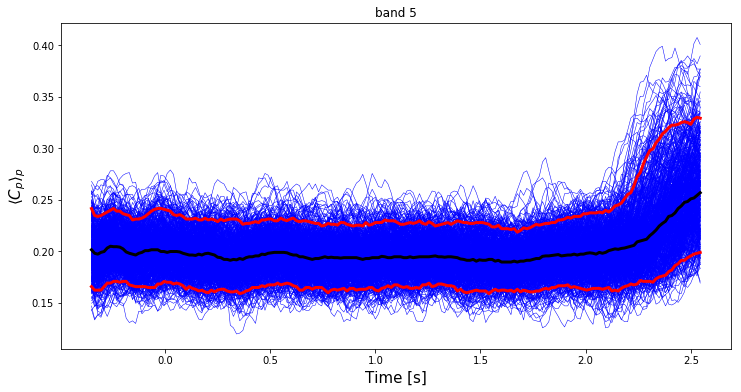

In [85]:
for b in range(len(net.bands)):
    plt.figure(figsize=(12,6))
    for i in range(avg_coh.shape[1]):
        plt.plot(net.tarray, avg_coh[b,i,:], 'b', lw=.5)
    plt.plot(net.tarray, avg_coh[b,:,:].median(dim='trials'), 'k', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.95, dim='trials'), 'r', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.05, dim='trials'), 'r', lw=3)
    plt.title(bands[b])
    plt.ylabel(r'$\langle C_{p}\rangle_{p}$',fontsize=15)
    plt.xlabel('Time [s]',fontsize=15)

### Network measures

We can use the filtered super tensor to compute all sorts of networkd measures. Let's start by analysing the network measurements averaged over trials.

In [86]:
#Q_data  = np.load('../network_statistics/tt_1_br_1.npy', allow_pickle=True).item()
#Q       = Q_data['original']
#Qr      = Q_data['null']

In [87]:
##################################################################################
# DICTIONARIES TO STORE THE NETWORK MEASURES
##################################################################################
measures = ['degree', 'clustering', 'coreness', 'modularity']

# Q is used to represent an arbritary network measurement
Q = {}
# To store the measures on the randomized networks
Qr = {}

for m in measures:
    Q[m]  = {}
    Qr[m] = {}
    for i in range(len(net.bands)):
        Q[m][str(i)]  = {}
        Qr[m][str(i)] = {}

### Node degree

In [88]:
##################################################################################
# NODES' DEGREE
##################################################################################
for i in tqdm( range(len(net.bands)) ): 
    Q['degree'][str(i)]  = compute_nodes_degree(filtered_adjacency[:,:,i,:,:].values, mirror=False) 

100%|██████████| 5/5 [00:01<00:00,  3.02it/s]


In [89]:
 print(Q['degree'][str(i)].shape)

(49, 540, 194)


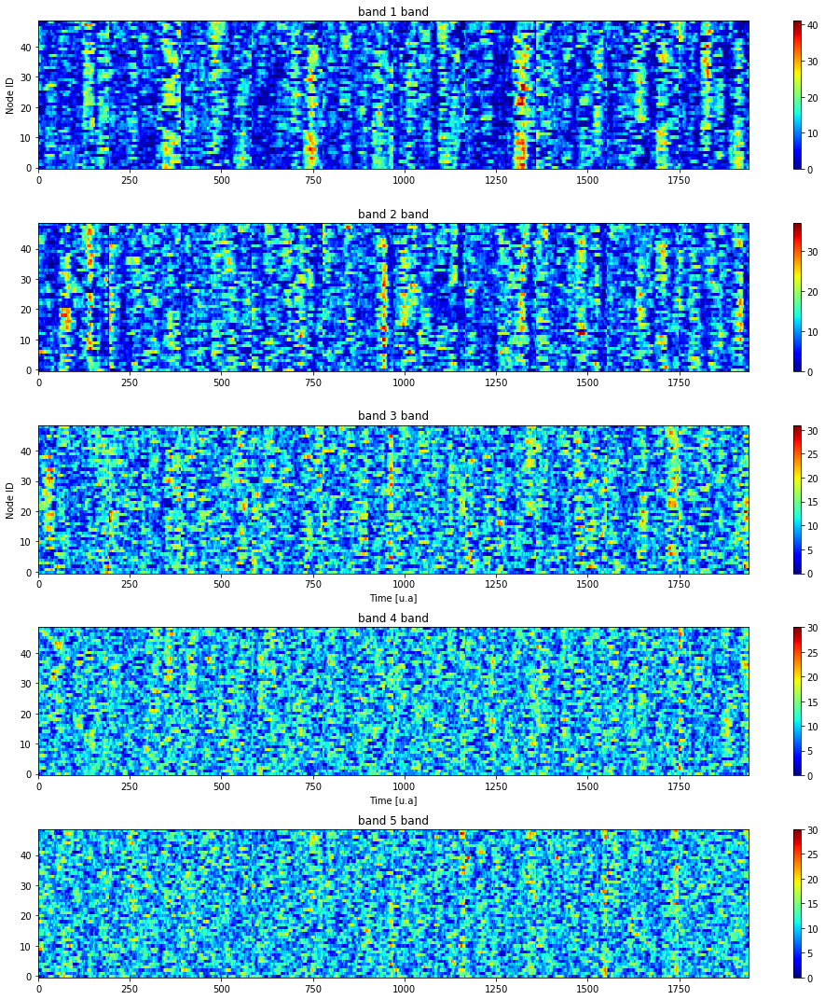

In [90]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q['degree'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_degree.png')

It is hard to compare both the weighted and binary version of the measure by means of the raster plot, however we can measure the summed strength/degree of the network for a more general view. Let's plot the the summed degree avareged on trials for each frequency band:

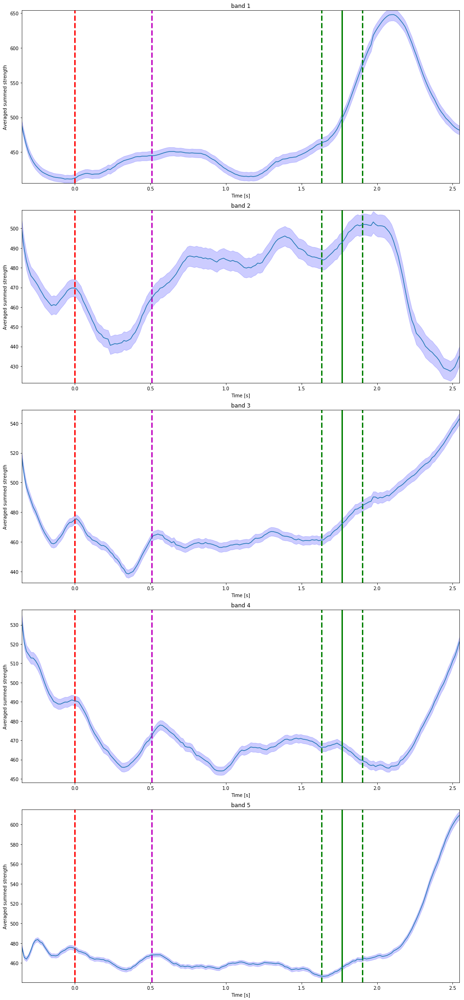

In [91]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    s_d = Q['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0) 
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_strength.png')

We can also measure the same quantities for the randomized version of the adjacency matrices:

In [92]:
for i in tqdm( range(len(net.bands)) ): 
    Qr['degree'][str(i)]  = compute_nodes_degree(A_r[:,:,i,:,:], mirror=False) 

100%|██████████| 5/5 [00:01<00:00,  3.55it/s]


Let's compare a random adjacency matrix with its randomized version.

Text(0.5, 1.0, 'Randomized, band 1 observation 120')

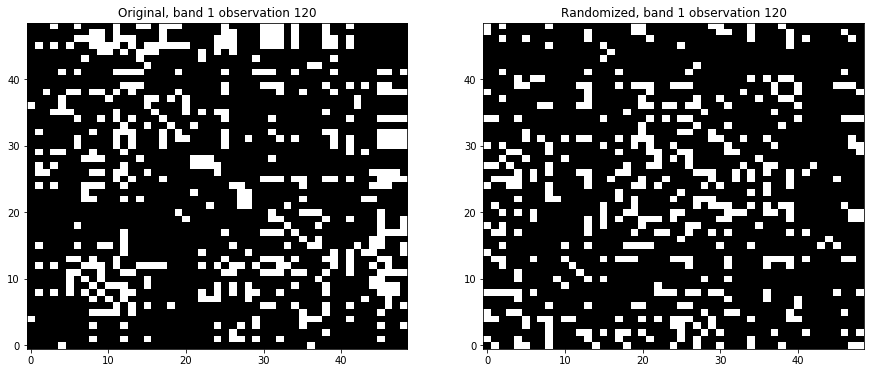

In [93]:
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
t_rnd = np.random.randint(0, net.super_tensor.shape[-1])
plt.imshow(net.A[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Original, band 1 observation ' + str(t_rnd))
plt.subplot(1,2,2)
plt.imshow(A_r[:,:,1,10,t_rnd], aspect='auto', cmap='gray', origin='lower')
plt.title(r'Randomized, band 1 observation ' + str(t_rnd))

Next we plot the average summed degree for the original and randomized networks

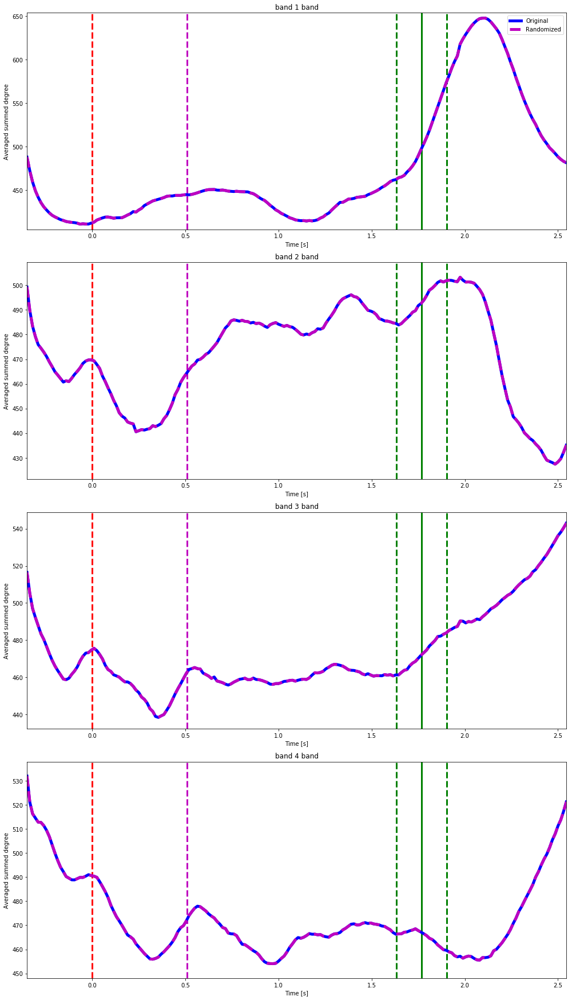

In [94]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands)-1 ):
    plt.subplot(5,1,j+1)
    # Original
    s_d = Q['degree'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    #
    plt.plot(net.tarray, s_d_m, 'b', lw=5)
    # Random
    s_d = Qr['degree'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    #
    plt.plot(net.tarray, s_d_m, 'm--', lw=5)
    if j == 0:
        plt.legend(['Original', 'Randomized'])
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed degree')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/strength_random_edges.png')

### Coreness 

In [95]:
for i in range(len(net.bands)):
    Q['coreness'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Q['coreness'][str(i)][:,t,:] = compute_nodes_coreness(filtered_adjacency[:,:,i,t,:].values, is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 5994.38it/s]


100%|██████████| 194/194 [00:00<00:00, 4417.14it/s]


100%|██████████| 194/194 [00:00<00:00, 5904.94it/s]


100%|██████████| 194/194 [00:00<00:00, 6054.82it/s]


100%|██████████| 194/194 [00:00<00:00, 6082.88it/s]


100%|██████████| 194/194 [00:00<00:00, 5898.43it/s]


100%|██████████| 194/194 [00:00<00:00, 5869.80it/s]


100%|██████████| 194/194 [00:00<00:00, 6006.59it/s]


100%|██████████| 194/194 [00:00<00:00, 4730.56it/s]


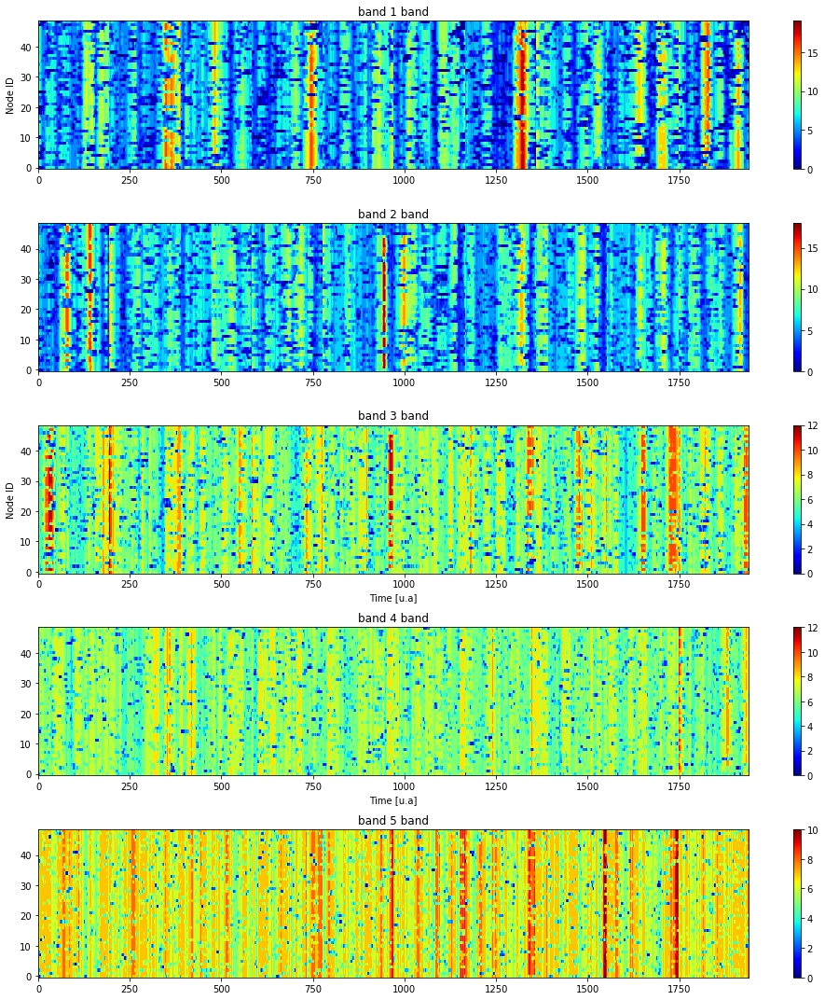

In [96]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q['coreness'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_coreness.png')

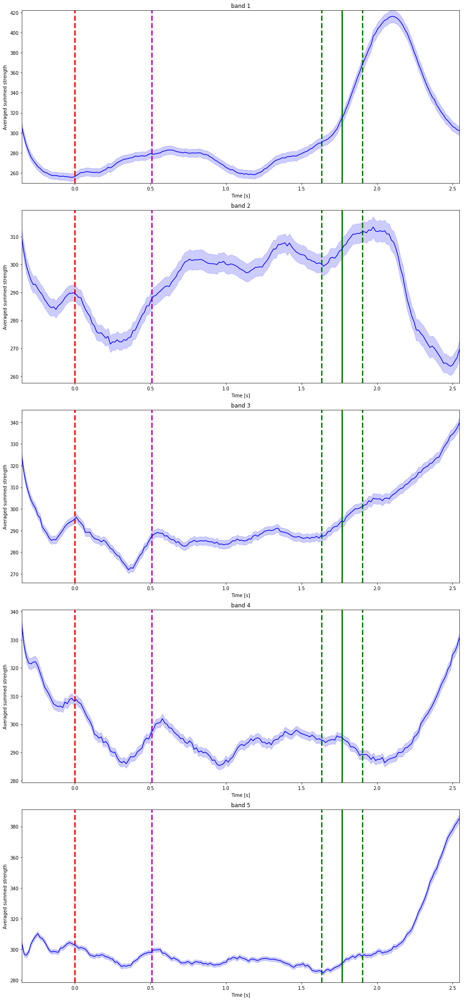

In [97]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    s_d = Q['coreness'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-6, s_d_m.max()+6])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_coreness.png')

### Coreness - Excess

In [98]:
for i in range(len(net.bands)):
    Qr['coreness'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Qr['coreness'][str(i)][:,t,:] = compute_nodes_coreness(A_r[:,:,i,t,:], is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 5753.02it/s]


100%|██████████| 194/194 [00:00<00:00, 5595.71it/s]


100%|██████████| 194/194 [00:00<00:00, 5742.95it/s]


100%|██████████| 194/194 [00:00<00:00, 5348.30it/s]


100%|██████████| 194/194 [00:00<00:00, 4829.25it/s]


100%|██████████| 194/194 [00:00<00:00, 5361.83it/s]


100%|██████████| 194/194 [00:00<00:00, 5297.08it/s]


100%|██████████| 194/194 [00:00<00:00, 5364.37it/s]


100%|██████████| 194/194 [00:00<00:00, 5478.36it/s]


100%|██████████| 5/5 [00:00<00:00, 31.08it/s]


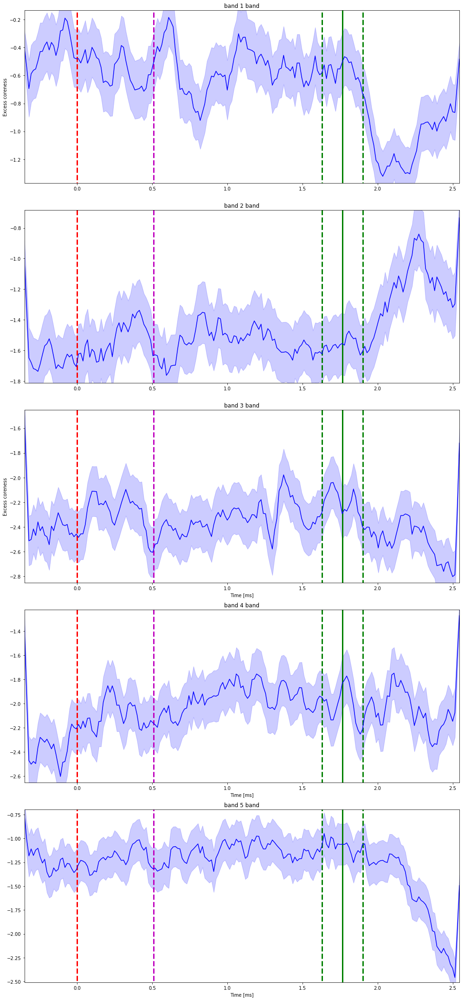

In [99]:
plt.figure(figsize=(14,30))
for j in tqdm( range(net.bands.shape[0]) ):
    # Summed for nodes
    null = Qr['coreness'][str(j)].sum(axis = 0)
    orig = Q['coreness'][str(j)].sum(axis = 0)
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = smooth( E.mean(axis = 0), 5)
    # Std over trials
    Es   = smooth( E.std(axis = 0) / np.sqrt(E.shape[0]), 5)
    # Plotting
    plt.subplot(5,1,j+1)
    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-.05, Em.max()+.05])
    if j == 0 or j == 2: plt.ylabel('Excess coreness')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_coreness.png')

### Clustering

In [100]:
for i in range(len(net.bands)):
    Q['clustering'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Q['clustering'][str(i)][:,t,:] = compute_nodes_clustering(filtered_adjacency[:,:,i,t,:].values, is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 5070.95it/s]


100%|██████████| 194/194 [00:00<00:00, 4948.49it/s]


100%|██████████| 194/194 [00:00<00:00, 5039.01it/s]


100%|██████████| 194/194 [00:00<00:00, 5002.83it/s]


100%|██████████| 194/194 [00:00<00:00, 5095.08it/s]


100%|██████████| 194/194 [00:00<00:00, 5089.82it/s]


100%|██████████| 194/194 [00:00<00:00, 5084.80it/s]


100%|██████████| 194/194 [00:00<00:00, 5094.92it/s]


100%|██████████| 194/194 [00:00<00:00, 5072.97it/s]


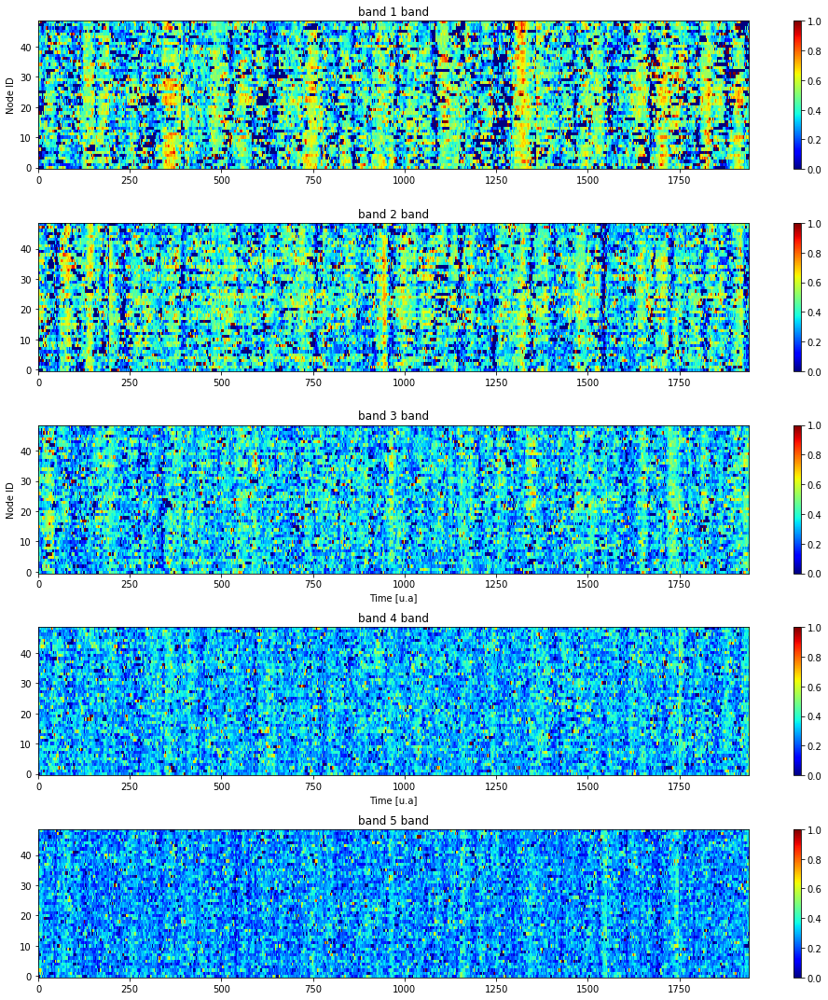

In [101]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q['clustering'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_clustering.png')

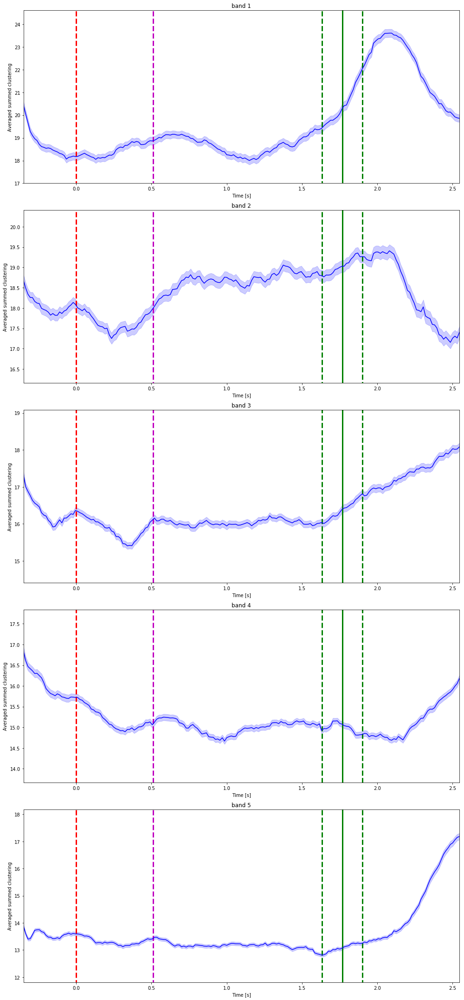

In [102]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    s_d = Q['clustering'][str(j)].sum(axis=0)
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-1, s_d_m.max()+1])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed clustering')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_clustering.png')

### Clustering - Excess

In [103]:
for i in range(len(net.bands)):
    Qr['clustering'][str(i)] = np.zeros([net.super_tensor.attrs['nC'],
                                      len(filtered_trials),
                                      len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Qr['clustering'][str(i)][:,t,:] = compute_nodes_clustering(A_r[:,:,i,t,:], is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 4933.13it/s]


100%|██████████| 194/194 [00:00<00:00, 5049.21it/s]


100%|██████████| 194/194 [00:00<00:00, 5037.98it/s]


100%|██████████| 194/194 [00:00<00:00, 5000.83it/s]


100%|██████████| 194/194 [00:00<00:00, 5013.62it/s]


100%|██████████| 194/194 [00:00<00:00, 4699.96it/s]


100%|██████████| 194/194 [00:00<00:00, 4966.37it/s]


100%|██████████| 194/194 [00:00<00:00, 4973.20it/s]


100%|██████████| 194/194 [00:00<00:00, 5011.52it/s]


100%|██████████| 5/5 [00:00<00:00, 31.57it/s]


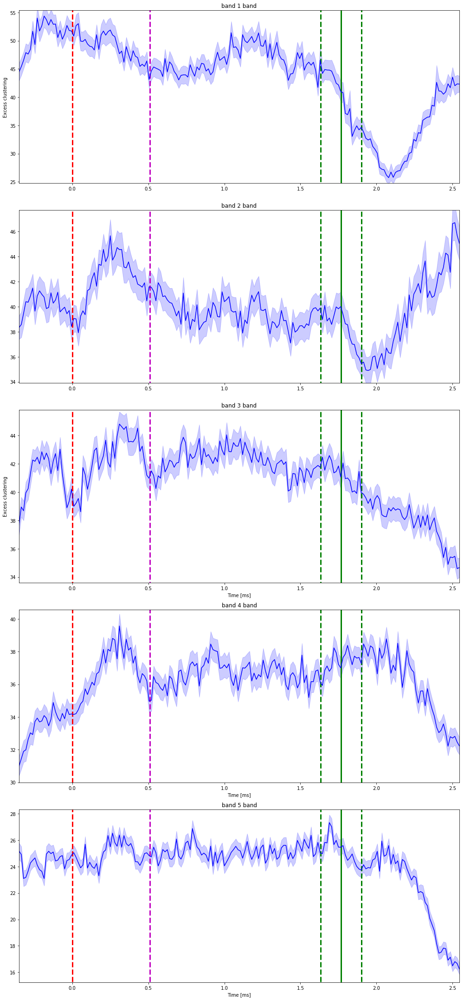

In [104]:
plt.figure(figsize=(14,30))
for j in tqdm( range(net.bands.shape[0]) ):
    # Summed for nodes
    null = Qr['clustering'][str(j)].sum(axis = 0)
    orig = Q['clustering'][str(j)].sum(axis = 0)
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = E.mean(axis = 0)
    # Std over trials
    Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
    # Plotting
    plt.subplot(5,1,j+1)
    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-1, Em.max()+1])
    if j == 0 or j == 2: plt.ylabel('Excess clustering')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_clustering.png')

### Modularity

In [105]:
for i in range(len(net.bands)):
    Q['modularity'][str(i)] = np.zeros([len(filtered_trials),
                                        len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Q['modularity'][str(i)][t,:] = compute_network_modularity(filtered_adjacency[:,:,i,t,:].values, is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 1408.33it/s]


100%|██████████| 194/194 [00:00<00:00, 1389.10it/s]


100%|██████████| 194/194 [00:00<00:00, 1414.90it/s]


100%|██████████| 194/194 [00:00<00:00, 1423.30it/s]


100%|██████████| 194/194 [00:00<00:00, 1360.53it/s]


100%|██████████| 194/194 [00:00<00:00, 1387.85it/s]


100%|██████████| 194/194 [00:00<00:00, 1424.77it/s]


100%|██████████| 194/194 [00:00<00:00, 1441.59it/s]


100%|██████████| 194/194 [00:00<00:00, 1398.24it/s]


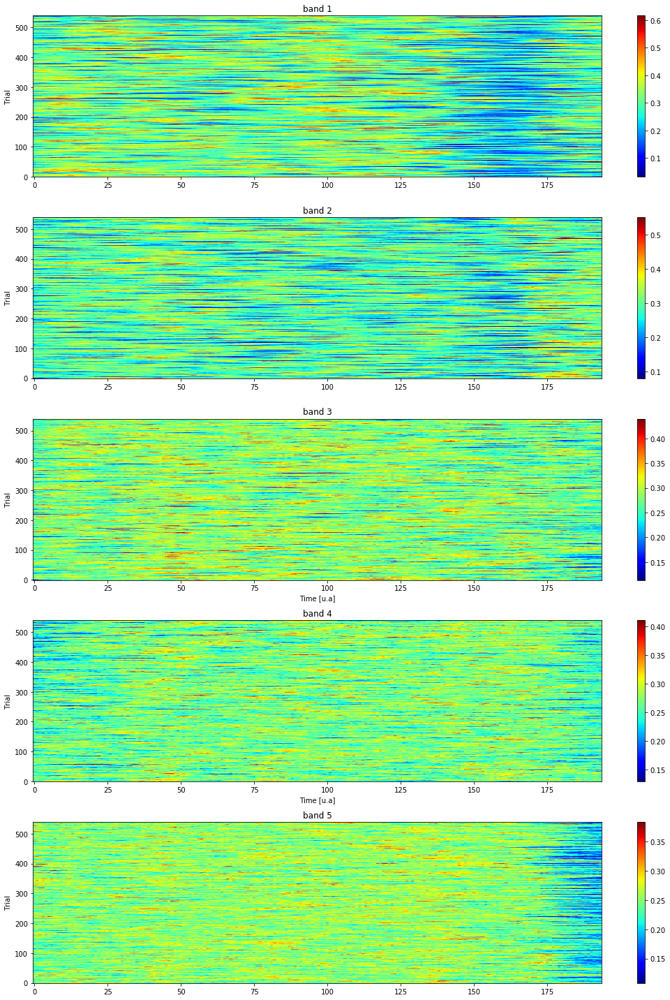

In [106]:
plt.figure(figsize=(15,20))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(Q['modularity'][str(i)], aspect='auto', cmap='jet', origin='lower')
    plt.colorbar()
    plt.title(bands[i])
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    plt.ylabel('Trial')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/raster_modularity.png')

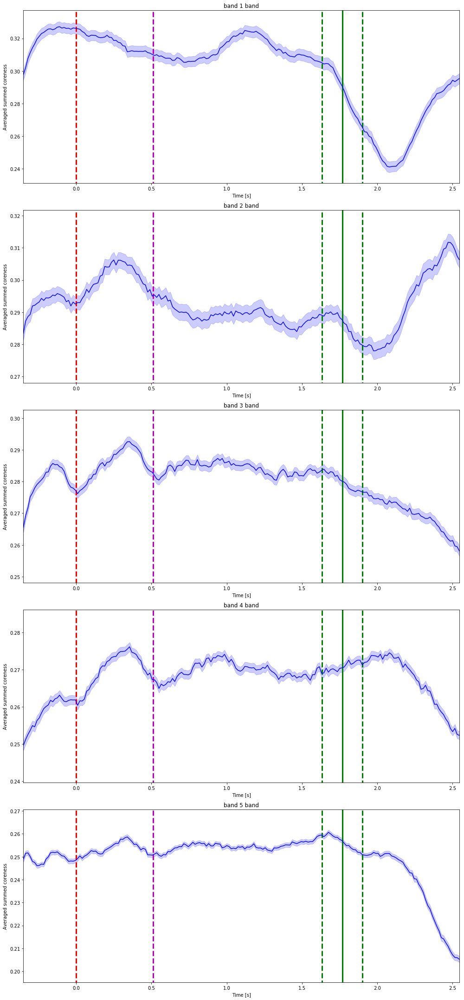

In [107]:
plt.figure(figsize=(14,30))
c = ['b', 'r']
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    s_d = Q['modularity'][str(j)]
    s_d_m = s_d.mean(axis = 0)
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    #
    plt.plot(net.tarray, s_d_m, color = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color = 'b')
    #
    plt.title(bands[j])
    #
    plt.title(bands[j] + ' band')
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([s_d_m.min()-.01, s_d_m.max()+.01])
    plt.vlines(0, s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-6, s_d_m.max()+6, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed coreness')
    plt.xlabel('Time [s]')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/summed_modularity.png')

###  Modularity - Chance level

In [108]:
for i in range(len(net.bands)):
    Qr['modularity'][str(i)] = np.zeros([len(filtered_trials),
                                        len(net.tarray)])

for t in range(len(filtered_trials)):
    for i in range(len(net.bands)):
        Qr['modularity'][str(i)][t,:] = compute_network_modularity(A_r[:,:,i,t,:], is_weighted=False)

100%|██████████| 194/194 [00:00<00:00, 1309.47it/s]


100%|██████████| 194/194 [00:00<00:00, 1334.90it/s]


100%|██████████| 194/194 [00:00<00:00, 1332.07it/s]


100%|██████████| 194/194 [00:00<00:00, 1337.16it/s]


100%|██████████| 194/194 [00:00<00:00, 1307.21it/s]


100%|██████████| 194/194 [00:00<00:00, 1320.26it/s]


100%|██████████| 194/194 [00:00<00:00, 1320.38it/s]


100%|██████████| 194/194 [00:00<00:00, 1321.25it/s]


100%|██████████| 194/194 [00:00<00:00, 1308.06it/s]


100%|██████████| 5/5 [00:00<00:00, 48.04it/s]


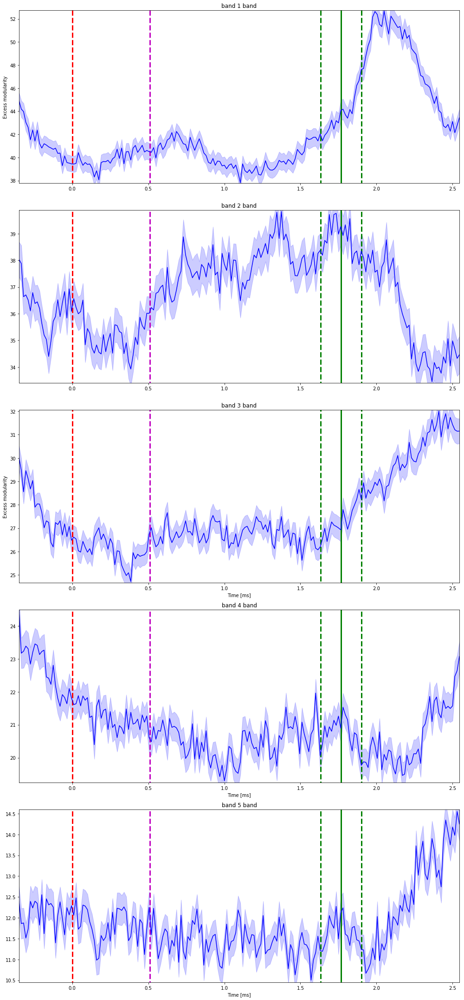

In [109]:
plt.figure(figsize=(14,30))
for j in tqdm( range(net.bands.shape[0]) ):
    plt.subplot(net.bands.shape[0],1,j+1)
    # Summed for nodes
    null = Qr['modularity'][str(j)]
    orig = Q['modularity'][str(j)]
    # Excess 
    E    = 100*(orig - null)/null
    # Average over trials
    Em   = E.mean(axis = 0)
    # Std over trials
    Es   = E.std(axis = 0) / np.sqrt(E.shape[0])
    # Plotting

    plt.plot(net.tarray, Em, color = 'b')
    plt.fill_between(net.tarray, Em-Es, Em+Es, color = 'b', alpha = .2)
    plt.xlim([net.tarray[0],net.tarray[-1]])
    plt.ylim([Em.min()-.05, Em.max()+.05])

    if j == 0 or j == 2: plt.ylabel('Excess modularity')
    if j >= 2: plt.xlabel('Time [ms]')
    plt.title(bands[j] + ' band')
    plt.vlines(0, Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       Em.min()-6, Em.max()+6, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       Em.min()-6, Em.max()+8, linestyle='--', linewidth = 3, color = 'g')
plt.tight_layout()
plt.savefig('../figures/layerwise_net/excess_modularity.png')

### Allegiance  matrix

In order to compute the allegiance matrix we first have to compute the layerwise community labes of each node in order to verity how often they fall in the same module, the allegiance matrix can be computed by using the method __compute_allegiance_matrix__.

In [60]:
nC = net.super_tensor.attrs['nC']
nT = len(filtered_trials)
T  = np.zeros([nC,nC,len(net.bands),len(s_names)])

In [71]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, nT, flatten=True)
print(s_mask['baseline'].shape)

(104760,)


In [74]:
filtered_adjacency_stacked = filtered_adjacency.stack(observations=("trials","time"))
for i in tqdm( range(len(net.bands)) ):
    for s_idx, s in zip(range(len(s_names)), s_names):
        T[:,:,i,s_idx] = compute_allegiance_matrix(
                           filtered_adjacency_stacked[:,:,i,s_mask[s]].values,
                           is_weighted=False) 



  0%|          | 0/5 [00:00<?, ?it/s]


  0%|          | 0/12960 [00:00<?, ?it/s]


  1%|          | 143/12960 [00:00<00:08, 1429.13it/s]


  2%|▏         | 283/12960 [00:00<00:08, 1419.76it/s]


  3%|▎         | 423/12960 [00:00<00:08, 1411.03it/s]


  4%|▍         | 564/12960 [00:00<00:08, 1408.60it/s]


  5%|▌         | 706/12960 [00:00<00:08, 1410.22it/s]


  7%|▋         | 844/12960 [00:00<00:08, 1397.03it/s]


  8%|▊         | 978/12960 [00:00<00:08, 1376.96it/s]


  9%|▊         | 1117/12960 [00:00<00:08, 1378.92it/s]


 10%|▉         | 1257/12960 [00:00<00:08, 1382.75it/s]


 11%|█         | 1395/12960 [00:01<00:08, 1380.98it/s]


 12%|█▏        | 1535/12960 [00:01<00:08, 1384.95it/s]


 13%|█▎        | 1674/12960 [00:01<00:08, 1384.22it/s]


 14%|█▍        | 1811/12960 [00:01<00:08, 1378.80it/s]


 15%|█▌        | 1948/12960 [00:01<00:08, 1363.92it/s]


 16%|█▌        | 2086/12960 [00:01<00:07, 1366.94it/s]


 17%|█▋        | 2223/12960 [00:01<00:07, 1353.50it/s]


 18%|█▊  

  2%|▏         | 938/45210 [00:00<00:33, 1336.58it/s]


  2%|▏         | 1072/45210 [00:00<00:33, 1336.41it/s]


  3%|▎         | 1206/45210 [00:00<00:32, 1335.68it/s]


  3%|▎         | 1339/45210 [00:01<00:32, 1331.79it/s]


  3%|▎         | 1471/45210 [00:01<00:32, 1326.31it/s]


  4%|▎         | 1602/45210 [00:01<00:33, 1320.82it/s]


  4%|▍         | 1736/45210 [00:01<00:32, 1325.58it/s]


  4%|▍         | 1871/45210 [00:01<00:32, 1329.97it/s]


  4%|▍         | 2004/45210 [00:01<00:32, 1324.07it/s]


  5%|▍         | 2136/45210 [00:01<00:32, 1320.21it/s]


  5%|▌         | 2270/45210 [00:01<00:32, 1325.88it/s]


  5%|▌         | 2403/45210 [00:01<00:32, 1320.19it/s]


  6%|▌         | 2535/45210 [00:01<00:32, 1316.43it/s]


  6%|▌         | 2668/45210 [00:02<00:32, 1319.58it/s]


  6%|▌         | 2800/45210 [00:02<00:33, 1261.77it/s]


  6%|▋         | 2929/45210 [00:02<00:33, 1268.10it/s]


  7%|▋         | 3060/45210 [00:02<00:32, 1279.77it/s]


  7%|▋         | 3189/45210 [00:

 69%|██████▊   | 31045/45210 [00:26<00:12, 1154.76it/s]


 69%|██████▉   | 31165/45210 [00:26<00:12, 1165.93it/s]


 69%|██████▉   | 31284/45210 [00:26<00:11, 1171.58it/s]


 69%|██████▉   | 31402/45210 [00:26<00:11, 1167.04it/s]


 70%|██████▉   | 31520/45210 [00:26<00:11, 1170.25it/s]


 70%|██████▉   | 31638/45210 [00:26<00:11, 1166.94it/s]


 70%|███████   | 31757/45210 [00:26<00:11, 1171.45it/s]


 71%|███████   | 31875/45210 [00:26<00:11, 1173.94it/s]


 71%|███████   | 31995/45210 [00:26<00:11, 1179.85it/s]


 71%|███████   | 32114/45210 [00:26<00:11, 1136.02it/s]


 71%|███████▏  | 32229/45210 [00:27<00:11, 1139.54it/s]


 72%|███████▏  | 32344/45210 [00:27<00:11, 1135.77it/s]


 72%|███████▏  | 32459/45210 [00:27<00:11, 1139.48it/s]


 72%|███████▏  | 32579/45210 [00:27<00:10, 1155.30it/s]


 72%|███████▏  | 32695/45210 [00:27<00:10, 1156.33it/s]


 73%|███████▎  | 32811/45210 [00:27<00:10, 1154.18it/s]


 73%|███████▎  | 32930/45210 [00:27<00:10, 1163.43it/s]


 73%|███████▎ 

 56%|█████▌    | 15759/28230 [00:12<00:10, 1221.11it/s]


 56%|█████▋    | 15882/28230 [00:12<00:10, 1210.13it/s]


 57%|█████▋    | 16006/28230 [00:12<00:10, 1208.11it/s]


 57%|█████▋    | 16128/28230 [00:12<00:09, 1211.43it/s]


 58%|█████▊    | 16252/28230 [00:12<00:09, 1219.40it/s]


 58%|█████▊    | 16374/28230 [00:13<00:09, 1202.81it/s]


 58%|█████▊    | 16499/28230 [00:13<00:09, 1214.11it/s]


 59%|█████▉    | 16621/28230 [00:13<00:09, 1215.49it/s]


 59%|█████▉    | 16746/28230 [00:13<00:09, 1224.53it/s]


 60%|█████▉    | 16869/28230 [00:13<00:09, 1201.30it/s]


 60%|██████    | 16991/28230 [00:13<00:09, 1205.26it/s]


 61%|██████    | 17116/28230 [00:13<00:09, 1215.64it/s]


 61%|██████    | 17241/28230 [00:13<00:08, 1224.23it/s]


 62%|██████▏   | 17367/28230 [00:13<00:08, 1233.29it/s]


 62%|██████▏   | 17492/28230 [00:13<00:08, 1238.13it/s]


 62%|██████▏   | 17616/28230 [00:14<00:08, 1236.88it/s]


 63%|██████▎   | 17740/28230 [00:14<00:08, 1237.12it/s]


 63%|██████▎  

 32%|███▏      | 5880/18360 [00:04<00:09, 1322.41it/s]


 33%|███▎      | 6013/18360 [00:04<00:09, 1323.23it/s]


 33%|███▎      | 6146/18360 [00:04<00:09, 1323.64it/s]


 34%|███▍      | 6279/18360 [00:04<00:09, 1325.42it/s]


 35%|███▍      | 6412/18360 [00:04<00:09, 1323.88it/s]


 36%|███▌      | 6545/18360 [00:04<00:08, 1324.52it/s]


 36%|███▋      | 6678/18360 [00:05<00:08, 1322.90it/s]


 37%|███▋      | 6811/18360 [00:05<00:08, 1309.11it/s]


 38%|███▊      | 6944/18360 [00:05<00:08, 1312.92it/s]


 39%|███▊      | 7076/18360 [00:05<00:08, 1309.48it/s]


 39%|███▉      | 7208/18360 [00:05<00:08, 1310.00it/s]


 40%|███▉      | 7340/18360 [00:05<00:08, 1312.34it/s]


 41%|████      | 7473/18360 [00:05<00:08, 1315.69it/s]


 41%|████▏     | 7605/18360 [00:05<00:08, 1310.92it/s]


 42%|████▏     | 7737/18360 [00:05<00:08, 1298.20it/s]


 43%|████▎     | 7868/18360 [00:05<00:08, 1299.53it/s]


 44%|████▎     | 7998/18360 [00:06<00:08, 1260.86it/s]


 44%|████▍     | 8126/18360 [00

 41%|████      | 18541/45210 [00:15<00:22, 1196.38it/s]


 41%|████▏     | 18661/45210 [00:15<00:22, 1186.79it/s]


 42%|████▏     | 18780/45210 [00:15<00:22, 1185.16it/s]


 42%|████▏     | 18900/45210 [00:15<00:22, 1188.61it/s]


 42%|████▏     | 19019/45210 [00:15<00:22, 1186.79it/s]


 42%|████▏     | 19140/45210 [00:15<00:21, 1193.00it/s]


 43%|████▎     | 19260/45210 [00:15<00:21, 1179.84it/s]


 43%|████▎     | 19381/45210 [00:15<00:21, 1186.46it/s]


 43%|████▎     | 19501/45210 [00:15<00:21, 1188.65it/s]


 43%|████▎     | 19622/45210 [00:15<00:21, 1193.97it/s]


 44%|████▎     | 19742/45210 [00:16<00:21, 1191.93it/s]


 44%|████▍     | 19862/45210 [00:16<00:21, 1179.56it/s]


 44%|████▍     | 19981/45210 [00:16<00:21, 1180.03it/s]


 44%|████▍     | 20100/45210 [00:16<00:21, 1176.82it/s]


 45%|████▍     | 20218/45210 [00:16<00:21, 1166.67it/s]


 45%|████▍     | 20339/45210 [00:16<00:21, 1176.93it/s]


 45%|████▌     | 20457/45210 [00:16<00:21, 1173.22it/s]


 46%|████▌    

  6%|▌         | 1714/28230 [00:01<00:20, 1321.73it/s]


  7%|▋         | 1848/28230 [00:01<00:19, 1324.84it/s]


  7%|▋         | 1981/28230 [00:01<00:19, 1323.75it/s]


  7%|▋         | 2113/28230 [00:01<00:19, 1315.55it/s]


  8%|▊         | 2247/28230 [00:01<00:19, 1320.75it/s]


  8%|▊         | 2379/28230 [00:01<00:19, 1319.38it/s]


  9%|▉         | 2512/28230 [00:01<00:19, 1320.74it/s]


  9%|▉         | 2646/28230 [00:02<00:19, 1324.53it/s]


 10%|▉         | 2779/28230 [00:02<00:19, 1320.92it/s]


 10%|█         | 2912/28230 [00:02<00:19, 1316.73it/s]


 11%|█         | 3044/28230 [00:02<00:19, 1301.60it/s]


 11%|█         | 3175/28230 [00:02<00:19, 1303.25it/s]


 12%|█▏        | 3306/28230 [00:02<00:19, 1300.96it/s]


 12%|█▏        | 3437/28230 [00:02<00:19, 1300.52it/s]


 13%|█▎        | 3568/28230 [00:02<00:18, 1303.12it/s]


 13%|█▎        | 3699/28230 [00:02<00:18, 1300.80it/s]


 14%|█▎        | 3830/28230 [00:02<00:18, 1301.57it/s]


 14%|█▍        | 3961/28230 [00

 32%|███▏      | 4188/12960 [00:03<00:06, 1265.51it/s]


 33%|███▎      | 4316/12960 [00:03<00:06, 1269.51it/s]


 34%|███▍      | 4445/12960 [00:03<00:06, 1272.70it/s]


 35%|███▌      | 4575/12960 [00:03<00:06, 1279.04it/s]


 36%|███▋      | 4703/12960 [00:03<00:06, 1263.57it/s]


 37%|███▋      | 4830/12960 [00:03<00:10, 773.50it/s] 


 38%|███▊      | 4962/12960 [00:04<00:09, 882.46it/s]


 39%|███▉      | 5093/12960 [00:04<00:08, 978.21it/s]


 40%|████      | 5225/12960 [00:04<00:07, 1058.97it/s]


 41%|████▏     | 5357/12960 [00:04<00:06, 1123.88it/s]


 42%|████▏     | 5487/12960 [00:04<00:06, 1171.25it/s]


 43%|████▎     | 5615/12960 [00:04<00:06, 1201.21it/s]


 44%|████▍     | 5742/12960 [00:04<00:05, 1217.74it/s]


 45%|████▌     | 5874/12960 [00:04<00:05, 1245.16it/s]


 46%|████▋     | 6005/12960 [00:04<00:05, 1262.06it/s]


 47%|████▋     | 6136/12960 [00:04<00:05, 1274.96it/s]


 48%|████▊     | 6266/12960 [00:05<00:05, 1280.07it/s]


 49%|████▉     | 6397/12960 [00:0

  9%|▉         | 4275/45210 [00:03<00:33, 1225.43it/s]


 10%|▉         | 4400/45210 [00:03<00:33, 1232.57it/s]


 10%|█         | 4526/45210 [00:03<00:32, 1238.67it/s]


 10%|█         | 4650/45210 [00:03<00:33, 1227.28it/s]


 11%|█         | 4776/45210 [00:03<00:32, 1235.22it/s]


 11%|█         | 4901/45210 [00:03<00:32, 1237.68it/s]


 11%|█         | 5027/45210 [00:04<00:32, 1244.21it/s]


 11%|█▏        | 5152/45210 [00:04<00:32, 1224.34it/s]


 12%|█▏        | 5275/45210 [00:04<00:32, 1221.75it/s]


 12%|█▏        | 5402/45210 [00:04<00:32, 1234.35it/s]


 12%|█▏        | 5528/45210 [00:04<00:31, 1240.56it/s]


 13%|█▎        | 5653/45210 [00:04<00:31, 1238.19it/s]


 13%|█▎        | 5779/45210 [00:04<00:31, 1243.98it/s]


 13%|█▎        | 5905/45210 [00:04<00:31, 1248.61it/s]


 13%|█▎        | 6030/45210 [00:04<00:31, 1247.95it/s]


 14%|█▎        | 6155/45210 [00:05<00:31, 1236.55it/s]


 14%|█▍        | 6279/45210 [00:05<00:32, 1208.56it/s]


 14%|█▍        | 6406/45210 [00

 43%|████▎     | 19324/45210 [00:16<00:22, 1161.41it/s]


 43%|████▎     | 19441/45210 [00:16<00:22, 1162.92it/s]


 43%|████▎     | 19559/45210 [00:16<00:21, 1167.87it/s]


 44%|████▎     | 19676/45210 [00:16<00:21, 1167.89it/s]


 44%|████▍     | 19795/45210 [00:16<00:21, 1171.91it/s]


 44%|████▍     | 19914/45210 [00:16<00:21, 1175.73it/s]


 44%|████▍     | 20032/45210 [00:16<00:21, 1175.13it/s]


 45%|████▍     | 20150/45210 [00:16<00:21, 1164.70it/s]


 45%|████▍     | 20268/45210 [00:16<00:21, 1167.40it/s]


 45%|████▌     | 20387/45210 [00:16<00:21, 1172.18it/s]


 45%|████▌     | 20505/45210 [00:17<00:21, 1164.50it/s]


 46%|████▌     | 20622/45210 [00:17<00:21, 1165.35it/s]


 46%|████▌     | 20739/45210 [00:17<00:20, 1166.09it/s]


 46%|████▌     | 20857/45210 [00:17<00:20, 1168.67it/s]


 46%|████▋     | 20975/45210 [00:17<00:20, 1171.92it/s]


 47%|████▋     | 21093/45210 [00:17<00:20, 1160.52it/s]


 47%|████▋     | 21211/45210 [00:17<00:20, 1163.79it/s]


 47%|████▋    

  7%|▋         | 1841/28230 [00:01<00:21, 1204.16it/s]


  7%|▋         | 1971/28230 [00:01<00:21, 1229.80it/s]


  7%|▋         | 2095/28230 [00:01<00:21, 1219.52it/s]


  8%|▊         | 2225/28230 [00:01<00:20, 1241.66it/s]


  8%|▊         | 2355/28230 [00:02<00:20, 1258.40it/s]


  9%|▉         | 2485/28230 [00:02<00:20, 1270.44it/s]


  9%|▉         | 2615/28230 [00:02<00:20, 1277.78it/s]


 10%|▉         | 2746/28230 [00:02<00:19, 1284.93it/s]


 10%|█         | 2875/28230 [00:02<00:19, 1277.93it/s]


 11%|█         | 3003/28230 [00:02<00:19, 1269.68it/s]


 11%|█         | 3133/28230 [00:02<00:19, 1276.99it/s]


 12%|█▏        | 3261/28230 [00:02<00:20, 1236.66it/s]


 12%|█▏        | 3390/28230 [00:02<00:19, 1250.64it/s]


 12%|█▏        | 3520/28230 [00:02<00:19, 1264.82it/s]


 13%|█▎        | 3650/28230 [00:03<00:19, 1275.01it/s]


 13%|█▎        | 3780/28230 [00:03<00:19, 1280.70it/s]


 14%|█▍        | 3909/28230 [00:03<00:19, 1274.97it/s]


 14%|█▍        | 4037/28230 [00

 31%|███       | 3998/12960 [00:03<00:07, 1261.68it/s]


 32%|███▏      | 4128/12960 [00:03<00:06, 1270.76it/s]


 33%|███▎      | 4258/12960 [00:03<00:06, 1278.90it/s]


 34%|███▍      | 4388/12960 [00:03<00:06, 1283.17it/s]


 35%|███▍      | 4517/12960 [00:03<00:06, 1265.48it/s]


 36%|███▌      | 4646/12960 [00:03<00:06, 1270.50it/s]


 37%|███▋      | 4774/12960 [00:03<00:06, 1261.21it/s]


 38%|███▊      | 4903/12960 [00:03<00:06, 1268.30it/s]


 39%|███▉      | 5030/12960 [00:03<00:06, 1252.22it/s]


 40%|███▉      | 5159/12960 [00:04<00:06, 1262.48it/s]


 41%|████      | 5289/12960 [00:04<00:06, 1271.01it/s]


 42%|████▏     | 5417/12960 [00:04<00:06, 1255.34it/s]


 43%|████▎     | 5545/12960 [00:04<00:05, 1261.01it/s]


 44%|████▍     | 5672/12960 [00:04<00:05, 1252.48it/s]


 45%|████▍     | 5800/12960 [00:04<00:05, 1260.51it/s]


 46%|████▌     | 5929/12960 [00:04<00:05, 1266.41it/s]


 47%|████▋     | 6058/12960 [00:04<00:05, 1271.13it/s]


 48%|████▊     | 6186/12960 [00

  8%|▊         | 3666/45210 [00:02<00:33, 1239.71it/s]


  8%|▊         | 3793/45210 [00:03<00:33, 1246.13it/s]


  9%|▊         | 3918/45210 [00:03<00:33, 1240.66it/s]


  9%|▉         | 4044/45210 [00:03<00:33, 1246.15it/s]


  9%|▉         | 4171/45210 [00:03<00:32, 1251.20it/s]


 10%|▉         | 4297/45210 [00:03<00:33, 1234.84it/s]


 10%|▉         | 4421/45210 [00:03<00:33, 1232.16it/s]


 10%|█         | 4545/45210 [00:03<00:33, 1227.44it/s]


 10%|█         | 4669/45210 [00:03<00:32, 1229.30it/s]


 11%|█         | 4793/45210 [00:03<00:32, 1232.22it/s]


 11%|█         | 4917/45210 [00:03<00:32, 1229.26it/s]


 11%|█         | 5042/45210 [00:04<00:32, 1233.57it/s]


 11%|█▏        | 5166/45210 [00:04<00:32, 1234.41it/s]


 12%|█▏        | 5290/45210 [00:04<00:32, 1218.59it/s]


 12%|█▏        | 5414/45210 [00:04<00:32, 1223.44it/s]


 12%|█▏        | 5538/45210 [00:04<00:32, 1227.18it/s]


 13%|█▎        | 5661/45210 [00:04<00:32, 1213.78it/s]


 13%|█▎        | 5783/45210 [00

 72%|███████▏  | 32345/45210 [00:28<00:12, 1018.78it/s]


 72%|███████▏  | 32453/45210 [00:28<00:12, 1034.33it/s]


 72%|███████▏  | 32561/45210 [00:28<00:12, 1045.24it/s]


 72%|███████▏  | 32669/45210 [00:28<00:12, 1040.52it/s]


 73%|███████▎  | 32780/45210 [00:28<00:11, 1058.87it/s]


 73%|███████▎  | 32893/45210 [00:29<00:11, 1077.52it/s]


 73%|███████▎  | 33006/45210 [00:29<00:11, 1090.85it/s]


 73%|███████▎  | 33116/45210 [00:29<00:11, 1092.89it/s]


 74%|███████▎  | 33230/45210 [00:29<00:10, 1104.43it/s]


 74%|███████▎  | 33341/45210 [00:29<00:10, 1095.71it/s]


 74%|███████▍  | 33452/45210 [00:29<00:10, 1099.80it/s]


 74%|███████▍  | 33563/45210 [00:29<00:10, 1101.64it/s]


 74%|███████▍  | 33674/45210 [00:29<00:10, 1060.07it/s]


 75%|███████▍  | 33785/45210 [00:29<00:10, 1073.98it/s]


 75%|███████▍  | 33897/45210 [00:29<00:10, 1086.46it/s]


 75%|███████▌  | 34010/45210 [00:30<00:10, 1098.70it/s]


 75%|███████▌  | 34122/45210 [00:30<00:10, 1103.26it/s]


 76%|███████▌ 

 57%|█████▋    | 15988/28230 [00:12<00:10, 1205.77it/s]


 57%|█████▋    | 16109/28230 [00:12<00:10, 1184.77it/s]


 57%|█████▋    | 16229/28230 [00:13<00:10, 1188.28it/s]


 58%|█████▊    | 16351/28230 [00:13<00:09, 1196.17it/s]


 58%|█████▊    | 16473/28230 [00:13<00:09, 1201.32it/s]


 59%|█████▉    | 16595/28230 [00:13<00:09, 1205.69it/s]


 59%|█████▉    | 16716/28230 [00:13<00:09, 1205.74it/s]


 60%|█████▉    | 16837/28230 [00:13<00:09, 1205.91it/s]


 60%|██████    | 16960/28230 [00:13<00:09, 1210.95it/s]


 61%|██████    | 17082/28230 [00:13<00:09, 1195.94it/s]


 61%|██████    | 17202/28230 [00:13<00:09, 1192.00it/s]


 61%|██████▏   | 17323/28230 [00:14<00:09, 1194.70it/s]


 62%|██████▏   | 17445/28230 [00:14<00:08, 1200.81it/s]


 62%|██████▏   | 17566/28230 [00:14<00:08, 1201.15it/s]


 63%|██████▎   | 17687/28230 [00:14<00:08, 1201.60it/s]


 63%|██████▎   | 17809/28230 [00:14<00:08, 1205.01it/s]


 64%|██████▎   | 17930/28230 [00:14<00:08, 1204.60it/s]


 64%|██████▍  

 27%|██▋       | 5040/18360 [00:03<00:10, 1256.32it/s]


 28%|██▊       | 5168/18360 [00:04<00:10, 1261.98it/s]


 29%|██▉       | 5296/18360 [00:04<00:10, 1265.99it/s]


 30%|██▉       | 5423/18360 [00:04<00:10, 1259.21it/s]


 30%|███       | 5551/18360 [00:04<00:10, 1265.05it/s]


 31%|███       | 5678/18360 [00:04<00:10, 1264.65it/s]


 32%|███▏      | 5805/18360 [00:04<00:09, 1258.15it/s]


 32%|███▏      | 5931/18360 [00:04<00:09, 1247.43it/s]


 33%|███▎      | 6056/18360 [00:04<00:09, 1247.29it/s]


 34%|███▎      | 6181/18360 [00:04<00:09, 1241.37it/s]


 34%|███▍      | 6307/18360 [00:04<00:09, 1244.47it/s]


 35%|███▌      | 6433/18360 [00:05<00:09, 1247.22it/s]


 36%|███▌      | 6558/18360 [00:05<00:09, 1243.34it/s]


 36%|███▋      | 6684/18360 [00:05<00:09, 1247.96it/s]


 37%|███▋      | 6809/18360 [00:05<00:09, 1192.37it/s]


 38%|███▊      | 6929/18360 [00:05<00:15, 728.37it/s] 


 38%|███▊      | 7053/18360 [00:05<00:13, 830.57it/s]


 39%|███▉      | 7178/18360 [00:

 36%|███▋      | 16461/45210 [00:14<00:25, 1139.75it/s]


 37%|███▋      | 16576/45210 [00:14<00:25, 1126.09it/s]


 37%|███▋      | 16689/45210 [00:14<00:25, 1126.41it/s]


 37%|███▋      | 16802/45210 [00:14<00:25, 1124.19it/s]


 37%|███▋      | 16918/45210 [00:14<00:24, 1132.86it/s]


 38%|███▊      | 17035/45210 [00:14<00:24, 1141.06it/s]


 38%|███▊      | 17152/45210 [00:14<00:24, 1148.42it/s]


 38%|███▊      | 17269/45210 [00:14<00:24, 1152.33it/s]


 38%|███▊      | 17385/45210 [00:15<00:24, 1152.29it/s]


 39%|███▊      | 17501/45210 [00:15<00:24, 1143.68it/s]


 39%|███▉      | 17616/45210 [00:15<00:24, 1144.49it/s]


 39%|███▉      | 17732/45210 [00:15<00:23, 1147.70it/s]


 39%|███▉      | 17847/45210 [00:15<00:23, 1147.48it/s]


 40%|███▉      | 17962/45210 [00:15<00:23, 1143.59it/s]


 40%|███▉      | 18079/45210 [00:15<00:23, 1149.17it/s]


 40%|████      | 18194/45210 [00:15<00:23, 1146.20it/s]


 40%|████      | 18310/45210 [00:15<00:23, 1149.92it/s]


 41%|████     

 97%|█████████▋| 43665/45210 [00:39<00:01, 1041.08it/s]


 97%|█████████▋| 43771/45210 [00:39<00:01, 1045.89it/s]


 97%|█████████▋| 43880/45210 [00:39<00:01, 1056.81it/s]


 97%|█████████▋| 43989/45210 [00:39<00:01, 1064.95it/s]


 98%|█████████▊| 44096/45210 [00:40<00:01, 1017.05it/s]


 98%|█████████▊| 44205/45210 [00:40<00:00, 1036.02it/s]


 98%|█████████▊| 44315/45210 [00:40<00:00, 1052.62it/s]


 98%|█████████▊| 44425/45210 [00:40<00:00, 1064.11it/s]


 99%|█████████▊| 44534/45210 [00:40<00:00, 1069.43it/s]


 99%|█████████▊| 44642/45210 [00:40<00:00, 1062.35it/s]


 99%|█████████▉| 44749/45210 [00:40<00:00, 1015.67it/s]


 99%|█████████▉| 44856/45210 [00:40<00:00, 1030.65it/s]


 99%|█████████▉| 44965/45210 [00:40<00:00, 1045.93it/s]


100%|█████████▉| 45074/45210 [00:40<00:00, 1057.17it/s]


100%|██████████| 45210/45210 [00:41<00:00, 1101.35it/s]



  0%|          | 0/28230 [00:00<?, ?it/s]


  0%|          | 131/28230 [00:00<00:21, 1306.82it/s]


  1%|          | 261/28230 [0

 98%|█████████▊| 27642/28230 [00:23<00:00, 1135.73it/s]


 98%|█████████▊| 27756/28230 [00:23<00:00, 1108.26it/s]


 99%|█████████▊| 27869/28230 [00:23<00:00, 1112.14it/s]


 99%|█████████▉| 27985/28230 [00:23<00:00, 1123.29it/s]


100%|█████████▉| 28098/28230 [00:23<00:00, 1124.04it/s]


100%|██████████| 28230/28230 [00:23<00:00, 1180.87it/s]


100%|██████████| 5/5 [11:17<00:00, 135.53s/it]


#### Band 1

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


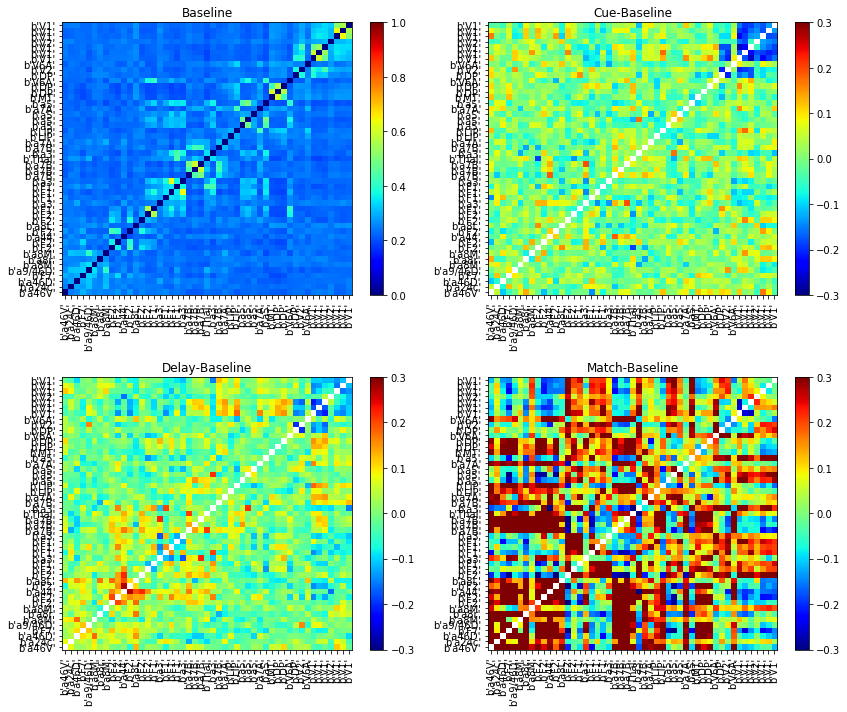

In [76]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,0,k]-T[:,:,0,0])/T[:,:,0,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,0,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_theta.png')

#### Band 2

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


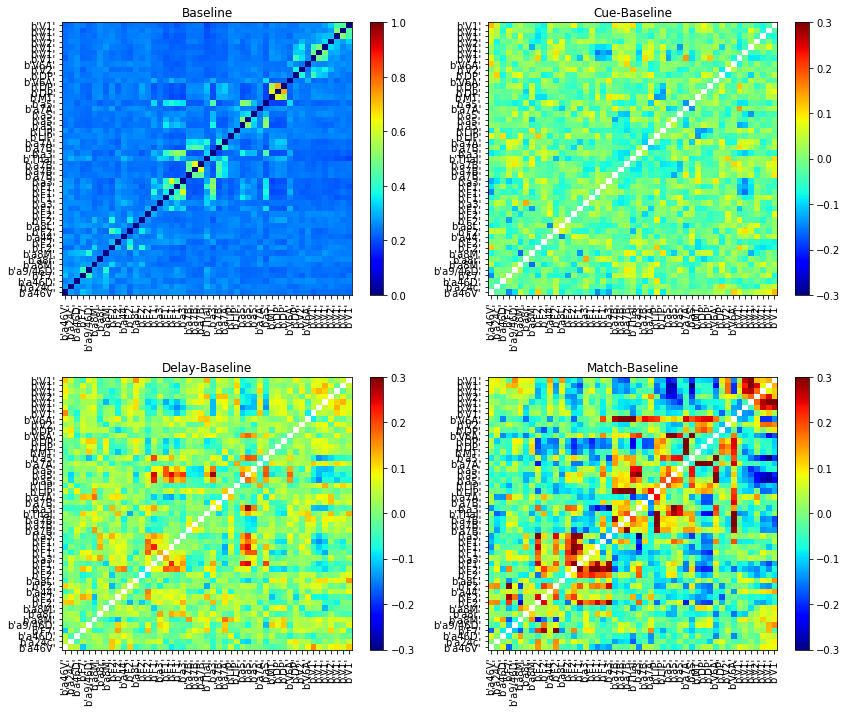

In [77]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,1,k]-T[:,:,1,0])/T[:,:,1,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,1,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_alpha.png')

#### Band 3

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


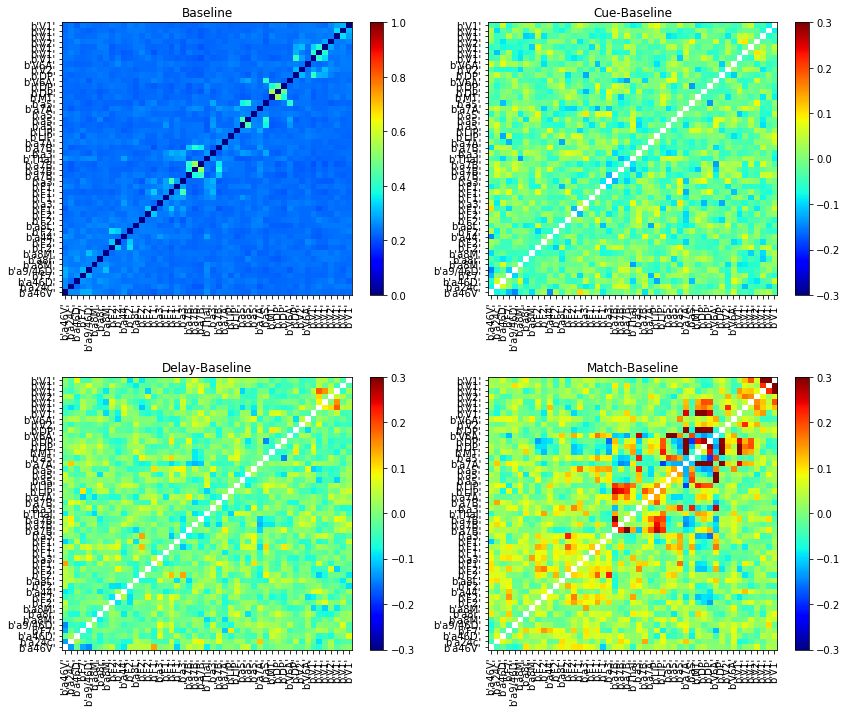

In [78]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,2,k]-T[:,:,2,0])/T[:,:,2,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,2,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_beta.png')

#### Band 4

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


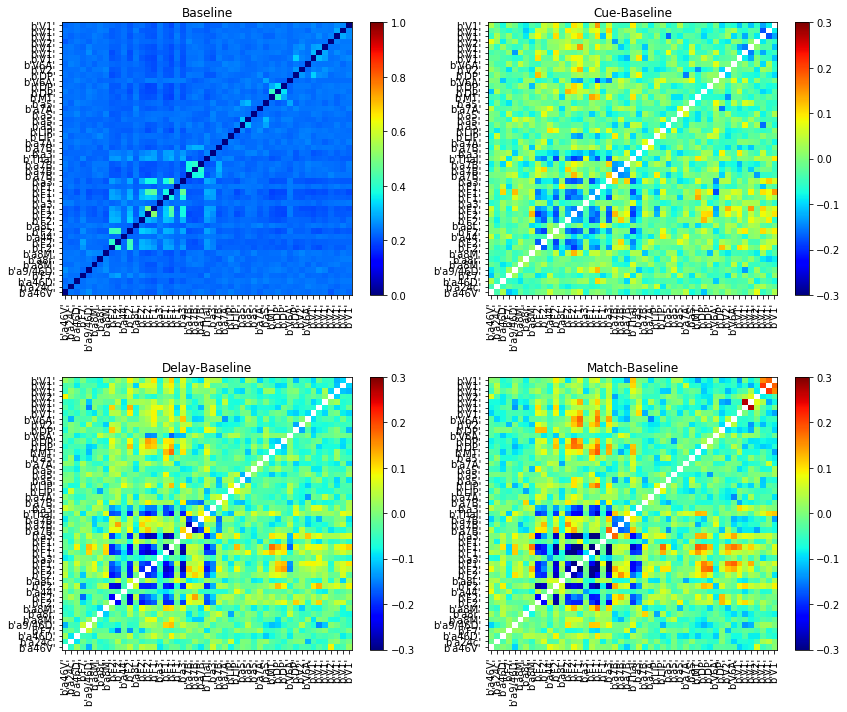

In [79]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,3,k]-T[:,:,3,0])/T[:,:,3,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,3,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_gamma.png')

#### Band 5

/opt/ohpc/pub/libs/gnu8/python/3.6.6/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in true_divide
  


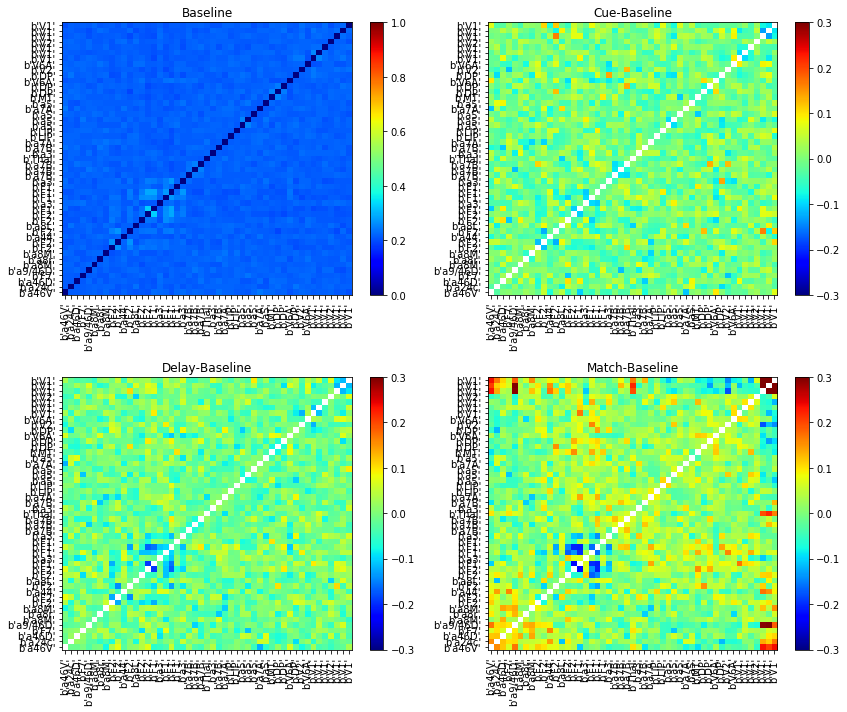

In [80]:
title = ['Baseline', 'Cue-Baseline', 'Delay-Baseline', 'Match-Baseline']
plt.figure(figsize=(12,10))
for k in range(4):
    plt.subplot(2,2,k+1)
    if k > 0:
        plt.imshow((T[:,:,4,k]-T[:,:,4,0])/T[:,:,4,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = -.3, vmax = .3)
    else:
        plt.imshow(T[:,:,4,0], aspect = 'auto', cmap = 'jet', origin = 'lower', vmin = 0, vmax = 1)
    plt.colorbar()
    plt.xticks(range(net.session_info['nC']), net.session_info['areas'], rotation = 90)
    plt.yticks(range(net.session_info['nC']), net.session_info['areas'])
    plt.title(title[k])
plt.tight_layout()
plt.savefig('../figures/layerwise_net/allegiance_high_gamma.png')

### Plotting on the brain surface

Plotting some of the quantities we measured above in the brain surface.

In [110]:
# Creating stages mask with trials concatenated
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, len(filtered_trials_idx), flatten=True)

In [111]:
from GDa.graphics.plot_brain_sketch import plot_node_brain_sketch, plot_edge_brain_sketch

In [112]:
Q['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray)).shape

(49, 104760)

#### Plotting average strength 

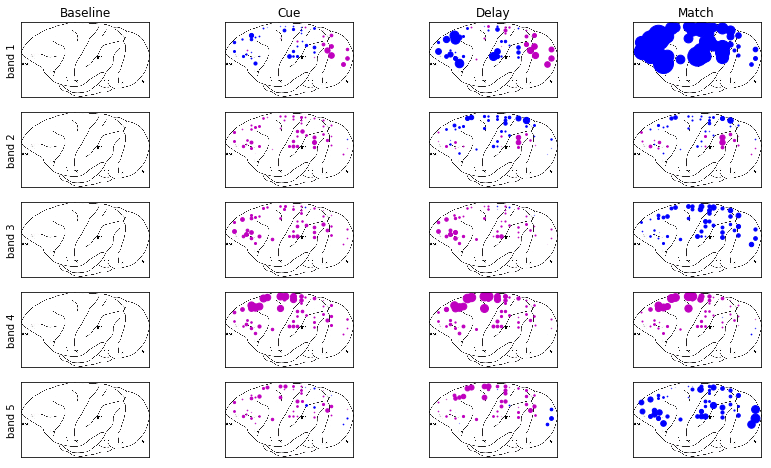

In [113]:
count = 1
alpha = 20
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=-1)
    sst_b  = aux[:,s_mask['baseline']].std(axis=-1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_b-st_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c = aux[:,s_mask['cue']].mean(axis=-1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d = aux[:,s_mask['delay']].mean(axis=-1).mean(axis=-1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m = aux[:,s_mask['match']].mean(axis=-1).mean(axis=-1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/st_brain_map.png')

#### Plotting average coreness 

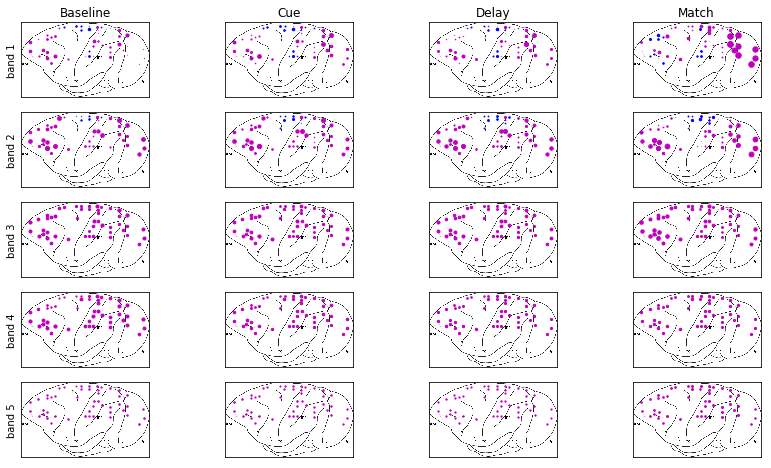

In [114]:
count = 1
alpha = 100
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=1)
    sst_b  = aux_r[:,s_mask['baseline']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = aux[:,s_mask['cue']].mean(axis=1)
    sst_c = aux_r[:,s_mask['cue']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = aux[:,s_mask['delay']].mean(axis=1)
    sst_d = aux_r[:,s_mask['delay']].mean(axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    #st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = aux[:,s_mask['match']].mean(axis=1)
    sst_m = aux_r[:,s_mask['match']].mean(axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    #st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map.png')

#### Plotting average coreness (95% percentile)

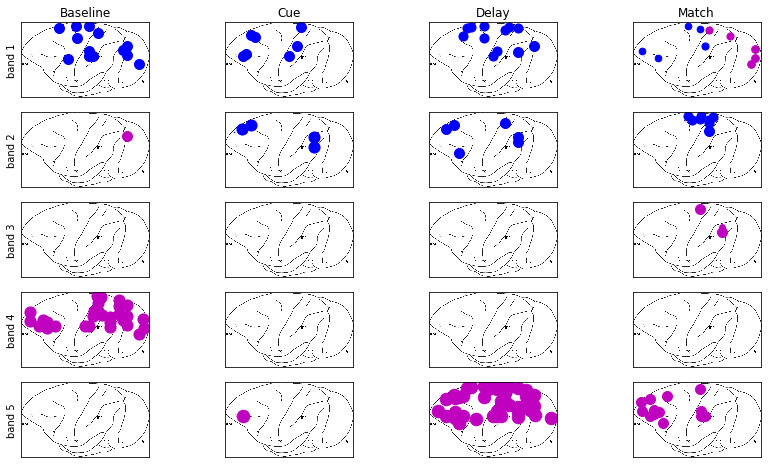

In [115]:
count = 1
alpha = 100
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['coreness'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = np.percentile(aux[:,s_mask['baseline']], 95, axis=1)
    sst_b  = np.percentile(aux_r[:,s_mask['baseline']], 95, axis=1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = np.percentile(aux[:,s_mask['cue']], 95, axis=1)
    sst_c = np.percentile(aux_r[:,s_mask['cue']], 95, axis=1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = np.percentile(aux[:,s_mask['delay']], 95, axis=1)
    sst_d = np.percentile(aux_r[:,s_mask['delay']], 95, axis=1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = np.percentile(aux[:,s_mask['match']], 95, axis=1)
    sst_m = np.percentile(aux_r[:,s_mask['match']], 95, axis=1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/coreness_brain_map95.png')

#### Plotting average clustering

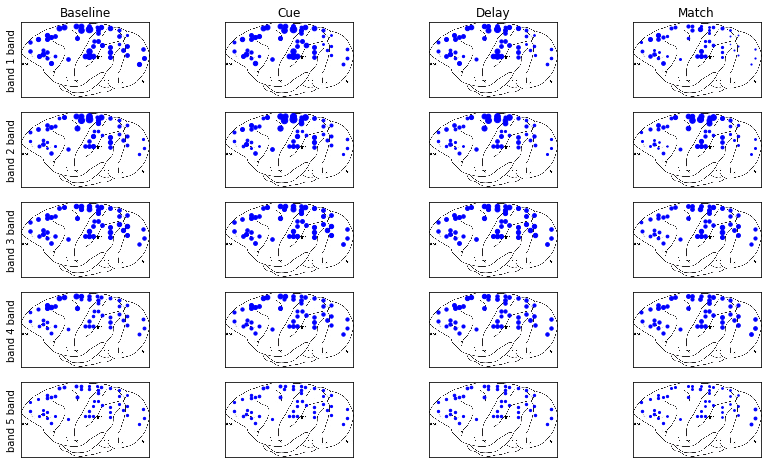

In [117]:
count = 1
alpha = 10
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q['clustering'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    aux_r  = Qr['clustering'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=1)
    sst_b  = aux_r[:,s_mask['baseline']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_b-sst_b)/sst_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i] + ' band')
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c  = aux[:,s_mask['cue']].mean(axis=1)
    sst_c = aux_r[:,s_mask['cue']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_c-sst_c)/sst_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d  = aux[:,s_mask['delay']].mean(axis=1)
    sst_d = aux_r[:,s_mask['delay']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_d-sst_d)/sst_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m  = aux[:,s_mask['match']].mean(axis=1)
    sst_m = aux_r[:,s_mask['match']].mean(axis=1)
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), (st_m-sst_m)/sst_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')
plt.savefig('../figures/layerwise_net/clustering_brain_map.png')

### Finding temporal communities

Using teneto to find the temporal communities (testing)

In [71]:
from teneto import TemporalNetwork
from teneto import communitydetection

In [72]:
tnet = TemporalNetwork(from_array = filtered_adjacency[:,:,1,:20,:].stack(
                                        observations=('trials','time')).values, nettype = 'bu'
                       )

In [ ]:
out = communitydetection.temporal_louvain(tnet, resolution=1, intersliceweight=1, n_iter=100, 
                                          negativeedge='ignore', randomseed=None, 
                                          consensus_threshold=0.5, temporal_consensus=True, 
                                          njobs=40)

In [ ]:
plt.figure(figsize=(8,6))
plt.imshow(out, aspect = 'auto', cmap = 'jet', origin = 'lower', extent = [net.tarray[0],net.tarray[-1],0,48])
plt.colorbar()
plt.title(r'$\omega = 1$, and $\Gamma = 1$')
plt.yticks(net.session_info['areas'], net.session_info['areas'])
plt.xlabel('Time [ms]')

### Comparing with the intervealed fixation task

In [133]:
# Getting the number for fixation trials
filtered_trials_fix     = net.trial_info[(net.trial_info['trial_type']==2.0)].trial_index.values
# Getting the index for those trials
filtered_trials_fix_idx = net.trial_info[(net.trial_info['trial_type']==2.0)].index.values

In [134]:
# Filter supertensor for the desired trials
filtered_super_tensor_fix = net.super_tensor.sel(trials = filtered_trials_fix)

In [120]:
filtered_super_tensor_fix

<xarray.DataArray (links: 1176, bands: 5, trials: 76, time: 194)>
array([[[[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [ True,  True,  True, ...,  True, False, False],
         [False, False, False, ...,  True,  True,  True],
         ...,
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True, False],
         ...,
         [False,  True,  True, ..., False, False, False],
         [ True,  True,  True, ...,  True,  True,  True],
         [ True,  True, False, ...,  True,  True,  True]]],


       [[[False, False, False, ...,  True,  True,  True],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True,  True, ...,  True,  True,  True],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]],

        [[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False,  True],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ...,  True, False, False],
         [ True,  True,  True, ..., False, False, False]],

        [[False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ...,  True,  True,  True],
         [ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False]]],


       [[[ True,  True,  True, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [ True,  True,  True, ..., False, F

In [121]:
filtered_adjacency_fix = net.A.sel(trials = filtered_trials_fix)

In [122]:
filtered_adjacency_fix

<xarray.DataArray (roi_1: 49, roi_2: 49, bands: 5, trials: 76, time: 194)>
array([[[[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]]],


        [[[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [1., 1., 1., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          ...,
          [1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 0.],
          ...,
          [0., 1., 1., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 1., 1.],
          [1., 1., 0., ..., 1., 1., 1.]]],


        [[[0., 0., 0., ..., 1., 1., 1.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [1., 1., 1., ..., 1., 1., 1.],
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.]],

         [[1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 1.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 1., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.]],

         [[0., 0., 0., ..., 0., 0., 0.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 0., ..., 0., 0., 0.],
          ...,
          [0., 0., 0., ..., 1., 1., 1.],
          [1., 1., 1., ..., 0., 0., 0.],
          [0., 0., 

In [123]:
##################################################################################
# DICTIONARIES TO STORE THE NETWORK MEASURES FOR THE FIXATION TASK
##################################################################################
measures = ['degree', 'clustering', 'coreness', 'modularity']

# Q is used to represent an arbritary network measurement
Q_fix = {}
# To store the measures on the randomized networks
Qr_fix = {}

for m in measures:
    Q_fix[m]  = {}
    Qr_fix[m] = {}
    for i in range(len(net.bands)):
        Q_fix[m][str(i)]  = {}
        Q_fix[m][str(i)] = {}

### Average coherence

Text(0, 0.5, 'Average coherence')

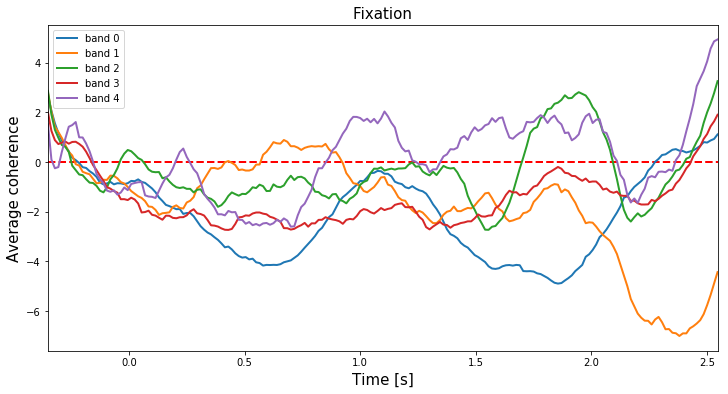

In [124]:
plt.figure(figsize=(12,6))
# Averaged supertensor
avg_coh = filtered_super_tensor_fix.mean(dim='links').mean(dim='trials')
# Baseline indexes
b_idx   = net.tarray<0
for i in range(len(net.bands)):
    Z = (avg_coh[i]-avg_coh[i,b_idx].mean())/avg_coh[i,b_idx].std()
    plt.plot(net.tarray, Z, lw=2, label='band ' + str(i) )
plt.hlines(0,net.tarray[0],net.tarray[-1], linestyles='--', color='r', lw=2)
plt.xlim([net.tarray[0],net.tarray[-1]])
plt.legend()
plt.title('Fixation', fontsize=15)
plt.xlabel('Time [s]', fontsize=15)
plt.ylabel('Average coherence', fontsize=15)

In [125]:
avg_coh = filtered_super_tensor_fix.mean(dim='links')

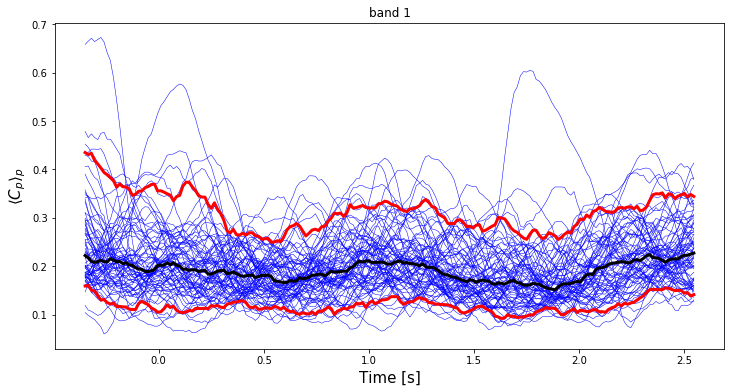

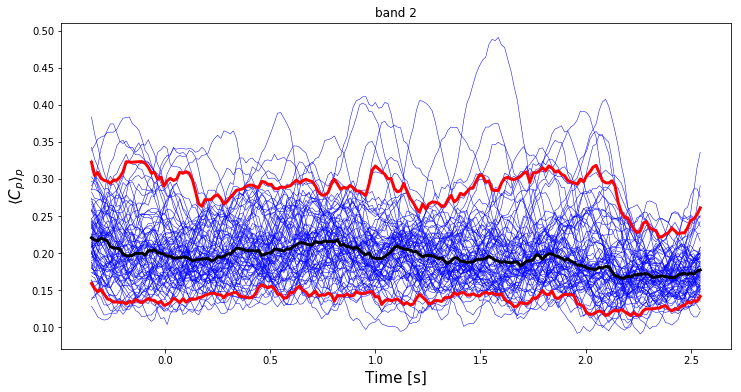

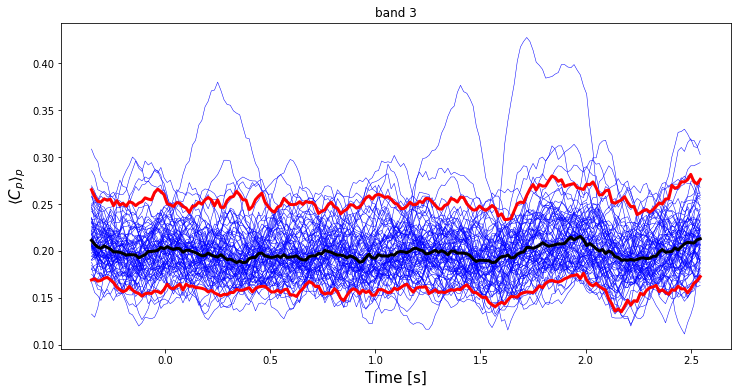

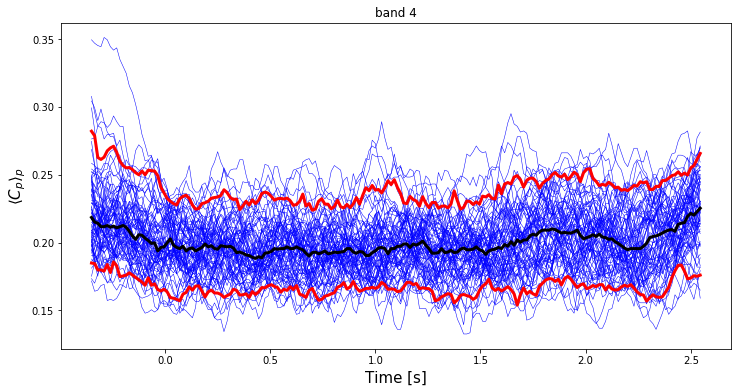

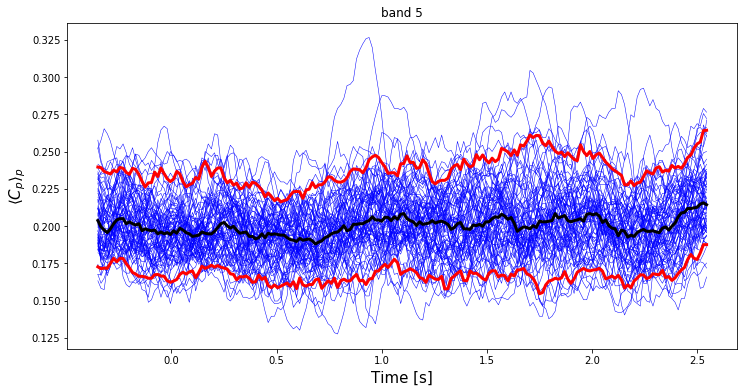

In [126]:
for b in range(len(net.bands)):
    plt.figure(figsize=(12,6))
    for i in range(avg_coh.shape[1]):
        plt.plot(net.tarray, avg_coh[b,i,:], 'b', lw=.5)
    plt.plot(net.tarray, avg_coh[b,:,:].median(dim='trials'), 'k', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.95, dim='trials'), 'r', lw=3)
    plt.plot(net.tarray, avg_coh[b,:,:].quantile(0.05, dim='trials'), 'r', lw=3)
    plt.title(bands[b])
    plt.ylabel(r'$\langle C_{p}\rangle_{p}$',fontsize=15)
    plt.xlabel('Time [s]',fontsize=15)

### Strength

In [127]:
# Randomized adjacency matrix for the filtered data
A_r_fix = np.empty_like(filtered_adjacency_fix)
for t in tqdm( range(len(filtered_trials_fix)) ):
    for i in range(len(net.bands)):
        A_r_fix[:,:,i,t,:] = randomize_edges(filtered_adjacency_fix[:,:,i,t,:].values, n_rewires=1000)

100%|██████████| 76/76 [01:02<00:00,  1.21it/s]


In [128]:
##################################################################################
# NODES' DEGREE
##################################################################################
for i in tqdm( range(len(net.bands)) ): 
    Q_fix['degree'][str(i)]  = compute_nodes_degree(filtered_adjacency_fix[:,:,i,:,:].values, mirror=False)

100%|██████████| 5/5 [00:00<00:00, 21.97it/s]


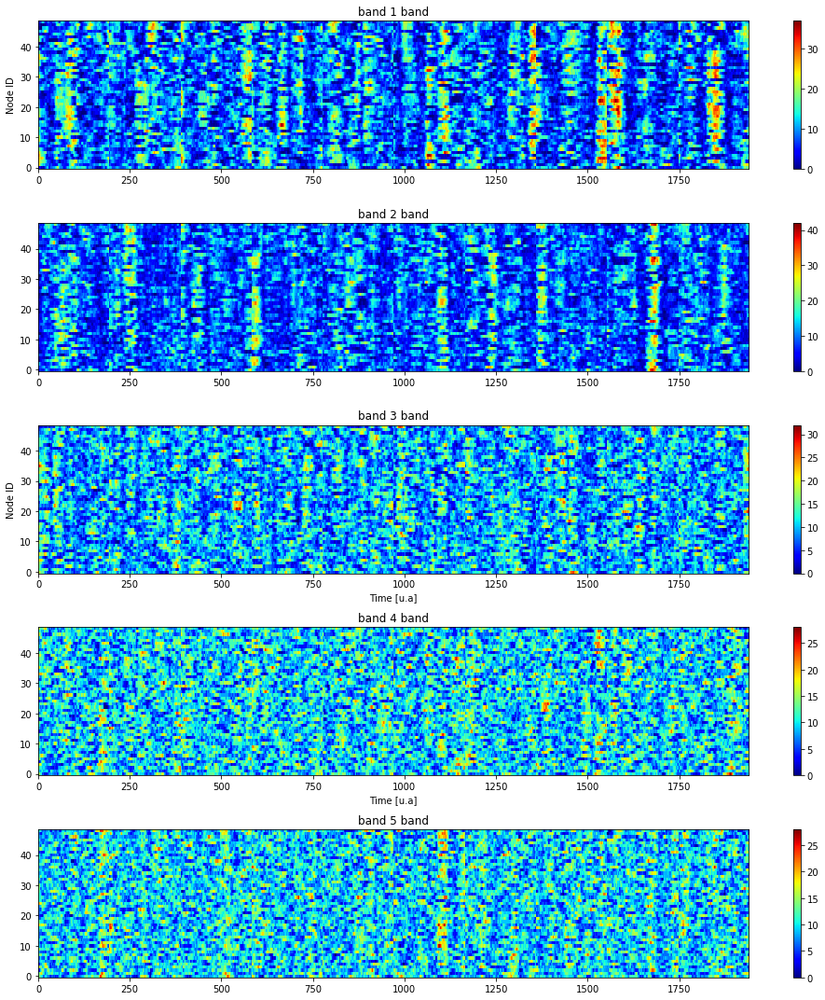

In [129]:
plt.figure(figsize=(14,15))
for i in range(len(net.bands)):
    plt.subplot(5,1,i+1)
    plt.imshow(
        Q_fix['degree'][str(i)][:,:10,:].reshape(net.super_tensor.attrs['nC'],10*len(net.tarray)), 
        aspect='auto', cmap='jet', origin='lower'
    )
    plt.colorbar()
    plt.title(bands[i]+' band')
    if i == 2 or i == 3: plt.xlabel('Time [u.a]')
    if i == 0 or i == 2: plt.ylabel('Node ID')
plt.tight_layout()

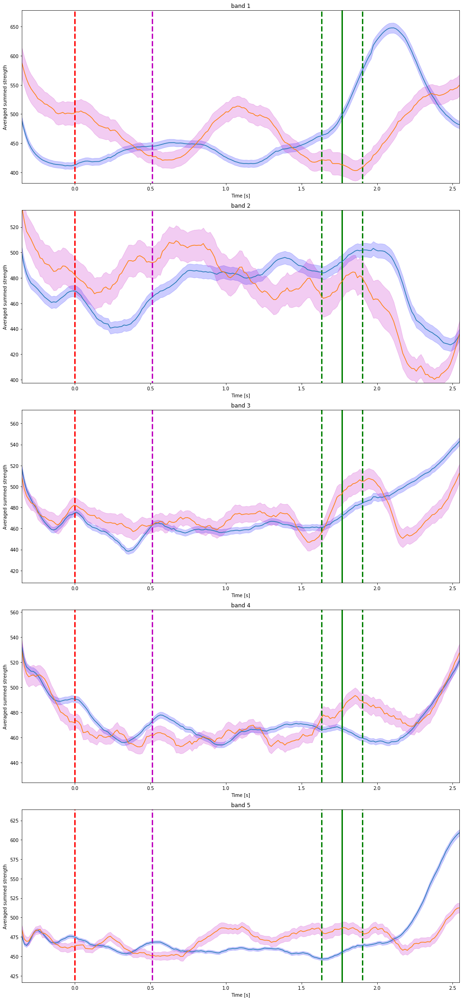

In [130]:
plt.figure(figsize=(14,30))
for j in range( len(net.bands) ):
    plt.subplot(len(net.bands),1,j+1)
    # Summed degree for all nodes
    # ODRT
    s_d = Q['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0) 
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'b')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='b')
    plt.ylim([s_d_m.min()-30, s_d_m.max()+30])
    # FIXATION
    s_d = Q_fix['degree'][str(j)].sum(axis=0)
    # Average over trials
    s_d_m = s_d.mean(axis = 0) 
    # Std over trials
    s_d_e = s_d.std(axis = 0) / (s_d.shape[0]**0.5)
    plt.plot(net.tarray, s_d_m, label = 'm')
    plt.fill_between(net.tarray, s_d_m-s_d_e, s_d_m+s_d_e, alpha = .2, color='m')
    #
    plt.title(bands[j])
    plt.xlim([net.tarray[0],net.tarray[-1]])

    plt.vlines(0, s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'r')
    plt.vlines((net.session_info['t_cue_off']-net.session_info['t_cue_on']).mean()/1000, 
                   s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'm')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='-', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000-(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'g')
    plt.vlines((net.session_info['t_match_on']-net.session_info['t_cue_on']).mean()/1000+(net.session_info['t_match_on']-net.session_info['t_cue_on']).std()/1000, 
                       s_d_m.min()-40, s_d_m.max()+200, linestyle='--', linewidth = 3, color = 'g')
    plt.ylabel('Averaged summed strength')
    plt.xlabel('Time [s]')
plt.tight_layout()

### Plotting in the brain surface

In [136]:
# Creating stages mask
s_mask = create_stages_time_grid(net.super_tensor.attrs['t_cue_on'][filtered_trials_fix_idx], 
                                 net.super_tensor.attrs['t_cue_off'][filtered_trials_fix_idx],
                                 net.super_tensor.attrs['t_match_on'][filtered_trials_fix_idx], 
                                 net.super_tensor.attrs['fsample'],
                                 net.tarray, len(filtered_trials_fix_idx), flatten=True)
print(s_mask['baseline'].shape)

(14744,)


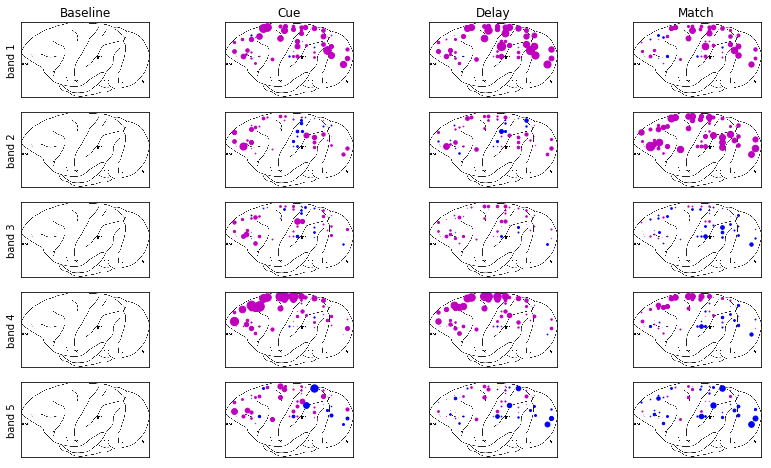

In [137]:
count = 1
alpha = 20
beta  = 1
plt.figure(figsize=(14,8))
for i in range( len(net.bands) ):
    plt.subplot(5, 4, count)
    aux    = Q_fix['degree'][str(i)].reshape(net.super_tensor.attrs['nC'],len(filtered_trials_fix) * len(net.tarray))
    # Baseline
    st_b   = aux[:,s_mask['baseline']].mean(axis=-1)
    sst_b  = aux[:,s_mask['baseline']].std(axis=-1)
    #st_bn = st_random[:,i,net.t_baseline].mean(axis=1)
    #st_b  = (st_b - st_b)/st_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_b-st_b, alpha, beta, 'hot')
    count += 1
    plt.ylabel(bands[i])
    if i == 0: plt.title('Baseline')
    # Cue
    plt.subplot(5, 4, count)
    st_c = aux[:,s_mask['cue']].mean(axis=-1)
    #st_cn = st_random[:,i,net.t_cue].mean(axis=1)
    st_c = (st_c - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_c, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Cue')
    # Delay
    plt.subplot(5, 4, count)
    st_d = aux[:,s_mask['delay']].mean(axis=-1).mean(axis=-1)
    #st_dn = st_random[:,i,net.t_delay].mean(axis=1)
    st_d = (st_d - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_d, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Delay')
    # Match
    plt.subplot(5, 4, count)
    st_m = aux[:,s_mask['match']].mean(axis=-1).mean(axis=-1)
    #st_mn = st_random[:,i,net.t_match].mean(axis=1)
    st_m = (st_m - st_b)/sst_b
    plot_node_brain_sketch(net.session_info['channels_labels'].astype(int), st_m, alpha, beta,  'hot')
    count += 1
    if i == 0: plt.title('Match')